# COVID-19 Growth Rate Prediction
> Predictions of COVID-19 Growth Rates Using Bayesian Modeling

- comments: true
- author: Thomas Wiecki & Hamel Husain
- categories: [growth, MCMC]
- image: images/covid-bayesian.png
- permalink: /growth-bayes/

In [1]:
#hide
from pathlib import Path

loadpy = Path('load_covid_data.py')
if not loadpy.exists():
    ! wget https://raw.githubusercontent.com/github/covid19-dashboard/master/_notebooks/load_covid_data.py

In [2]:
#hide
%matplotlib inline
import numpy as np
from IPython.display import display, Markdown
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import seaborn as sns
import arviz as az
import pymc3 as pm
import altair as alt

import load_covid_data

sns.set_context('talk')
plt.style.use('seaborn-whitegrid')

## Set this to true to see legacy charts
debug=False

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


## Data

In [3]:
#hide

df = load_covid_data.load_data(drop_states=True, filter_n_days_100=2)
# We only have data for China after they already had a significant number of cases.
# They also are not well modeled by the exponential, so we drop them here for simplicity.
df = df.loc[lambda x: x.country != 'China (total)']

countries = df.country.unique()
n_countries = len(countries)
df = df.loc[lambda x: (x.days_since_100 >= 0)]

annotate_kwargs = dict(
    s='Based on COVID Data Repository by Johns Hopkins CSSE ({})\nBy Thomas Wiecki'.format(df.index.max().strftime('%B %d, %Y')), 
    xy=(0.05, 0.01), xycoords='figure fraction', fontsize=10)

These are the countries included in the model:

In [4]:
#hide_input
',   '.join(sorted(df.country.unique().tolist()))

'Algeria,   Argentina,   Armenia,   Australia (total),   Austria,   Bahrain,   Belgium,   Brazil,   Bulgaria,   Canada (total),   Chile,   Colombia,   Costa Rica,   Croatia,   Cruise Ship (total),   Czechia,   Denmark (total),   Dominican Republic,   Ecuador,   Egypt,   Estonia,   Finland,   France (total),   Germany,   Greece,   Hong Kong,   Hungary,   Iceland,   India,   Indonesia,   Iran,   Iraq,   Ireland,   Israel,   Italy,   Japan,   Korea, South,   Kuwait,   Latvia,   Lebanon,   Luxembourg,   Malaysia,   Mexico,   Netherlands (total),   Norway,   Pakistan,   Panama,   Peru,   Philippines,   Poland,   Portugal,   Qatar,   Romania,   Russia,   San Marino,   Saudi Arabia,   Serbia,   Singapore,   Slovakia,   Slovenia,   South Africa,   Spain,   Sweden,   Switzerland,   Taiwan*,   Thailand,   Turkey,   US (total),   United Arab Emirates,   United Kingdom (total),   Uruguay'

In [5]:
#hide

#####################################
##### This Cell Runs The Model ######
#####################################

with pm.Model() as model:
    ############
    # Intercept
    # Group mean
    a_grp = pm.Normal('a_grp', 100, 50)
    # Group variance
    a_grp_sigma = pm.HalfNormal('a_grp_sigma', 50)
    # Individual intercepts
    a_ind = pm.Normal('a_ind', 
                      mu=a_grp, sigma=a_grp_sigma, 
                      shape=n_countries)
    ########
    # Slope
    # Group mean
    b_grp = pm.Normal('b_grp', 1.33, .5)
    # Group variance
    b_grp_sigma = pm.HalfNormal('b_grp_sigma', .5)
    # Individual slopes
    b_ind = pm.Normal('b_ind', 
                      mu=b_grp, sigma=b_grp_sigma, 
                      shape=n_countries)
    
    # Error
    sigma = pm.HalfNormal('sigma', 500., shape=n_countries)
    
    # Create likelihood for each country
    for i, country in enumerate(countries):
        df_country = df.loc[lambda x: (x.country == country)]
        
        # By using pm.Data we can change these values after sampling.
        # This allows us to extend x into the future so we can get
        # forecasts by sampling from the posterior predictive
        x = pm.Data(country + "x_data", 
                    df_country.days_since_100.values)
        confirmed = pm.Data(country + "y_data", 
                            df_country.confirmed.astype('float64').values)
        
        # Likelihood
        pm.NegativeBinomial(
            country, 
            (a_ind[i] * b_ind[i] ** x), # Exponential regression
            sigma[i], 
            observed=confirmed)

In [6]:
#hide
with model:
    # Sample posterior
    trace = pm.sample(tune=1500, chains=1, cores=2, target_accept=.9)
    
    # Update data so that we get predictions into the future
    for country in countries:
        df_country = df.loc[lambda x: (x.country == country)]
        x_data = np.arange(0, 30)
        y_data = np.array([np.nan] * len(x_data))
        pm.set_data({country + "x_data": x_data})
        pm.set_data({country + "y_data": y_data})
    
    # Sample posterior predictive
    post_pred = pm.sample_posterior_predictive(trace, samples=80)

Auto-assigning NUTS sampler...


Initializing NUTS using jitter+adapt_diag...


Sequential sampling (1 chains in 1 job)


NUTS: [sigma, b_ind, b_grp_sigma, b_grp, a_ind, a_grp_sigma, a_grp]


Sampling chain 0, 0 divergences:   0%|          | 0/2000 [00:00<?, ?it/s]

Sampling chain 0, 0 divergences:   0%|          | 1/2000 [00:00<18:14,  1.83it/s]

Sampling chain 0, 0 divergences:   0%|          | 7/2000 [00:00<12:54,  2.57it/s]

Sampling chain 0, 0 divergences:   1%|          | 13/2000 [00:00<09:15,  3.57it/s]

Sampling chain 0, 0 divergences:   1%|          | 19/2000 [00:00<06:40,  4.94it/s]

Sampling chain 0, 0 divergences:   1%|          | 23/2000 [00:01<04:56,  6.68it/s]

Sampling chain 0, 0 divergences:   2%|▏         | 30/2000 [00:01<03:36,  9.08it/s]

Sampling chain 0, 0 divergences:   2%|▏         | 36/2000 [00:01<02:43, 12.00it/s]

Sampling chain 0, 0 divergences:   2%|▏         | 42/2000 [00:01<02:04, 15.67it/s]

Sampling chain 0, 0 divergences:   2%|▏         | 48/2000 [00:01<01:39, 19.63it/s]

Sampling chain 0, 0 divergences:   3%|▎         | 54/2000 [00:01<01:19, 24.50it/s]

Sampling chain 0, 0 divergences:   3%|▎         | 60/2000 [00:01<01:13, 26.51it/s]

Sampling chain 0, 0 divergences:   3%|▎         | 65/2000 [00:02<01:13, 26.30it/s]

Sampling chain 0, 0 divergences:   4%|▎         | 71/2000 [00:02<01:03, 30.48it/s]

Sampling chain 0, 0 divergences:   4%|▍         | 76/2000 [00:02<01:04, 29.82it/s]

Sampling chain 0, 0 divergences:   4%|▍         | 80/2000 [00:02<01:11, 26.89it/s]

Sampling chain 0, 0 divergences:   4%|▍         | 84/2000 [00:02<01:15, 25.29it/s]

Sampling chain 0, 0 divergences:   4%|▍         | 87/2000 [00:02<01:49, 17.55it/s]

Sampling chain 0, 0 divergences:   4%|▍         | 90/2000 [00:04<06:32,  4.86it/s]

Sampling chain 0, 0 divergences:   5%|▍         | 92/2000 [00:06<13:35,  2.34it/s]

Sampling chain 0, 0 divergences:   5%|▍         | 94/2000 [00:07<16:12,  1.96it/s]

Sampling chain 0, 0 divergences:   5%|▍         | 95/2000 [00:08<20:18,  1.56it/s]

Sampling chain 0, 0 divergences:   5%|▍         | 96/2000 [00:09<23:22,  1.36it/s]

Sampling chain 0, 0 divergences:   5%|▍         | 97/2000 [00:10<25:17,  1.25it/s]

Sampling chain 0, 0 divergences:   5%|▍         | 98/2000 [00:11<26:35,  1.19it/s]

Sampling chain 0, 0 divergences:   5%|▍         | 99/2000 [00:12<27:21,  1.16it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 100/2000 [00:13<28:08,  1.12it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 101/2000 [00:14<28:44,  1.10it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 102/2000 [00:15<29:24,  1.08it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 103/2000 [00:16<29:29,  1.07it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 104/2000 [00:17<29:40,  1.06it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 105/2000 [00:18<29:44,  1.06it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 106/2000 [00:19<29:47,  1.06it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 107/2000 [00:20<29:54,  1.05it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 108/2000 [00:21<29:55,  1.05it/s]

Sampling chain 0, 0 divergences:   5%|▌         | 109/2000 [00:22<29:47,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 110/2000 [00:23<29:44,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 111/2000 [00:24<29:49,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 112/2000 [00:24<29:53,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 113/2000 [00:25<29:49,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 114/2000 [00:26<29:56,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 115/2000 [00:27<29:58,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 116/2000 [00:28<29:46,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 117/2000 [00:29<29:42,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 118/2000 [00:30<29:45,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 119/2000 [00:31<29:40,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 120/2000 [00:32<29:34,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 121/2000 [00:33<29:41,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 122/2000 [00:34<29:41,  1.05it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 123/2000 [00:35<29:34,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▌         | 124/2000 [00:36<29:22,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▋         | 125/2000 [00:37<29:25,  1.06it/s]

Sampling chain 0, 0 divergences:   6%|▋         | 126/2000 [00:37<22:17,  1.40it/s]

Sampling chain 0, 0 divergences:   6%|▋         | 127/2000 [00:38<24:24,  1.28it/s]

Sampling chain 0, 0 divergences:   6%|▋         | 128/2000 [00:39<26:02,  1.20it/s]

Sampling chain 0, 0 divergences:   6%|▋         | 129/2000 [00:40<27:07,  1.15it/s]

Sampling chain 0, 0 divergences:   6%|▋         | 130/2000 [00:41<27:58,  1.11it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 131/2000 [00:42<28:17,  1.10it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 132/2000 [00:43<28:32,  1.09it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 133/2000 [00:44<28:37,  1.09it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 134/2000 [00:45<28:57,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 135/2000 [00:45<28:53,  1.08it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 136/2000 [00:46<28:56,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 137/2000 [00:47<29:01,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 138/2000 [00:48<29:00,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 139/2000 [00:49<28:55,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 140/2000 [00:50<28:50,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 141/2000 [00:51<28:50,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 142/2000 [00:52<28:58,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 143/2000 [00:53<29:03,  1.07it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 144/2000 [00:54<29:07,  1.06it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 145/2000 [00:55<29:29,  1.05it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 146/2000 [00:56<29:22,  1.05it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 147/2000 [00:57<29:18,  1.05it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 148/2000 [00:58<29:16,  1.05it/s]

Sampling chain 0, 0 divergences:   7%|▋         | 149/2000 [00:59<29:26,  1.05it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 150/2000 [01:00<29:32,  1.04it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 151/2000 [01:01<29:14,  1.05it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 152/2000 [01:02<29:09,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 153/2000 [01:02<29:06,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 154/2000 [01:03<29:15,  1.05it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 155/2000 [01:04<29:03,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 156/2000 [01:05<28:56,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 157/2000 [01:06<28:55,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 158/2000 [01:07<28:51,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 159/2000 [01:08<28:52,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 160/2000 [01:09<28:47,  1.07it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 161/2000 [01:10<28:49,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 162/2000 [01:11<28:36,  1.07it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 163/2000 [01:12<28:33,  1.07it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 164/2000 [01:13<28:36,  1.07it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 165/2000 [01:14<28:48,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 166/2000 [01:15<28:44,  1.06it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 167/2000 [01:16<28:38,  1.07it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 168/2000 [01:17<28:35,  1.07it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 169/2000 [01:17<28:29,  1.07it/s]

Sampling chain 0, 0 divergences:   8%|▊         | 170/2000 [01:18<28:28,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▊         | 171/2000 [01:19<28:21,  1.08it/s]

Sampling chain 0, 0 divergences:   9%|▊         | 172/2000 [01:20<28:23,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▊         | 173/2000 [01:21<28:33,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▊         | 174/2000 [01:22<28:28,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 175/2000 [01:23<28:26,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 176/2000 [01:24<28:23,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 177/2000 [01:25<28:19,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 178/2000 [01:26<28:17,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 179/2000 [01:27<28:21,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 180/2000 [01:28<28:28,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 181/2000 [01:29<28:31,  1.06it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 182/2000 [01:30<28:26,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 183/2000 [01:31<28:27,  1.06it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 184/2000 [01:32<28:19,  1.07it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 185/2000 [01:32<28:26,  1.06it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 186/2000 [01:33<28:27,  1.06it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 187/2000 [01:34<28:29,  1.06it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 188/2000 [01:35<26:16,  1.15it/s]

Sampling chain 0, 0 divergences:   9%|▉         | 189/2000 [01:36<26:59,  1.12it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 190/2000 [01:37<27:22,  1.10it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 191/2000 [01:38<27:40,  1.09it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 192/2000 [01:39<27:48,  1.08it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 193/2000 [01:40<27:54,  1.08it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 194/2000 [01:41<27:53,  1.08it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 195/2000 [01:42<27:52,  1.08it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 196/2000 [01:43<27:53,  1.08it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 197/2000 [01:43<27:49,  1.08it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 198/2000 [01:44<28:03,  1.07it/s]

Sampling chain 0, 0 divergences:  10%|▉         | 199/2000 [01:45<28:04,  1.07it/s]

Sampling chain 0, 0 divergences:  10%|█         | 200/2000 [01:46<28:08,  1.07it/s]

Sampling chain 0, 0 divergences:  10%|█         | 201/2000 [01:50<53:03,  1.77s/it]

Sampling chain 0, 0 divergences:  10%|█         | 202/2000 [01:54<1:10:53,  2.37s/it]

Sampling chain 0, 0 divergences:  10%|█         | 203/2000 [01:58<1:23:48,  2.80s/it]

Sampling chain 0, 0 divergences:  10%|█         | 204/2000 [02:01<1:32:17,  3.08s/it]

Sampling chain 0, 0 divergences:  10%|█         | 205/2000 [02:05<1:38:19,  3.29s/it]

Sampling chain 0, 0 divergences:  10%|█         | 206/2000 [02:09<1:42:15,  3.42s/it]

Sampling chain 0, 0 divergences:  10%|█         | 207/2000 [02:13<1:45:04,  3.52s/it]

Sampling chain 0, 0 divergences:  10%|█         | 208/2000 [02:16<1:46:58,  3.58s/it]

Sampling chain 0, 0 divergences:  10%|█         | 209/2000 [02:20<1:48:13,  3.63s/it]

Sampling chain 0, 0 divergences:  10%|█         | 210/2000 [02:24<1:49:07,  3.66s/it]

Sampling chain 0, 0 divergences:  11%|█         | 211/2000 [02:27<1:49:36,  3.68s/it]

Sampling chain 0, 0 divergences:  11%|█         | 212/2000 [02:31<1:49:52,  3.69s/it]

Sampling chain 0, 0 divergences:  11%|█         | 213/2000 [02:35<1:50:51,  3.72s/it]

Sampling chain 0, 0 divergences:  11%|█         | 214/2000 [02:39<1:51:02,  3.73s/it]

Sampling chain 0, 0 divergences:  11%|█         | 215/2000 [02:41<1:34:31,  3.18s/it]

Sampling chain 0, 0 divergences:  11%|█         | 216/2000 [02:44<1:39:36,  3.35s/it]

Sampling chain 0, 0 divergences:  11%|█         | 217/2000 [02:46<1:26:21,  2.91s/it]

Sampling chain 0, 0 divergences:  11%|█         | 218/2000 [02:48<1:17:12,  2.60s/it]

Sampling chain 0, 0 divergences:  11%|█         | 219/2000 [02:50<1:10:53,  2.39s/it]

Sampling chain 0, 0 divergences:  11%|█         | 220/2000 [02:52<1:06:30,  2.24s/it]

Sampling chain 0, 0 divergences:  11%|█         | 221/2000 [02:54<1:03:06,  2.13s/it]

Sampling chain 0, 0 divergences:  11%|█         | 222/2000 [02:55<52:38,  1.78s/it]  

Sampling chain 0, 0 divergences:  11%|█         | 223/2000 [02:56<45:10,  1.53s/it]

Sampling chain 0, 0 divergences:  11%|█         | 224/2000 [02:57<39:54,  1.35s/it]

Sampling chain 0, 0 divergences:  11%|█▏        | 225/2000 [02:57<32:04,  1.08s/it]

Sampling chain 0, 0 divergences:  11%|█▏        | 226/2000 [02:58<26:36,  1.11it/s]

Sampling chain 0, 0 divergences:  11%|█▏        | 227/2000 [02:58<26:47,  1.10it/s]

Sampling chain 0, 0 divergences:  11%|█▏        | 228/2000 [02:59<22:52,  1.29it/s]

Sampling chain 0, 0 divergences:  11%|█▏        | 229/2000 [02:59<18:06,  1.63it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 230/2000 [03:00<16:52,  1.75it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 231/2000 [03:01<20:04,  1.47it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 232/2000 [03:02<30:41,  1.04s/it]

Sampling chain 0, 0 divergences:  12%|█▏        | 233/2000 [03:03<29:38,  1.01s/it]

Sampling chain 0, 0 divergences:  12%|█▏        | 234/2000 [03:04<24:50,  1.19it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 235/2000 [03:05<25:30,  1.15it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 236/2000 [03:05<21:57,  1.34it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 237/2000 [03:06<19:42,  1.49it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 238/2000 [03:06<17:59,  1.63it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 239/2000 [03:07<16:48,  1.75it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 240/2000 [03:08<20:06,  1.46it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 241/2000 [03:09<22:24,  1.31it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 242/2000 [03:09<19:50,  1.48it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 243/2000 [03:10<18:02,  1.62it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 244/2000 [03:10<16:51,  1.74it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 245/2000 [03:10<15:59,  1.83it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 246/2000 [03:11<15:16,  1.91it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 247/2000 [03:11<14:46,  1.98it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 248/2000 [03:12<14:28,  2.02it/s]

Sampling chain 0, 0 divergences:  12%|█▏        | 249/2000 [03:12<14:20,  2.04it/s]

Sampling chain 0, 0 divergences:  12%|█▎        | 250/2000 [03:13<14:04,  2.07it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 251/2000 [03:13<13:55,  2.09it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 252/2000 [03:14<14:09,  2.06it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 253/2000 [03:14<14:02,  2.07it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 254/2000 [03:15<14:00,  2.08it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 255/2000 [03:15<13:54,  2.09it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 256/2000 [03:16<13:44,  2.11it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 257/2000 [03:16<13:39,  2.13it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 258/2000 [03:17<13:36,  2.13it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 259/2000 [03:17<13:42,  2.12it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 260/2000 [03:18<13:40,  2.12it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 261/2000 [03:19<17:53,  1.62it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 262/2000 [03:19<20:36,  1.41it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 263/2000 [03:20<18:29,  1.57it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 264/2000 [03:20<17:05,  1.69it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 265/2000 [03:21<16:07,  1.79it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 266/2000 [03:21<15:23,  1.88it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 267/2000 [03:22<14:52,  1.94it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 268/2000 [03:22<14:26,  2.00it/s]

Sampling chain 0, 0 divergences:  13%|█▎        | 269/2000 [03:23<18:07,  1.59it/s]

Sampling chain 0, 0 divergences:  14%|█▎        | 270/2000 [03:24<20:43,  1.39it/s]

Sampling chain 0, 0 divergences:  14%|█▎        | 271/2000 [03:25<22:40,  1.27it/s]

Sampling chain 0, 0 divergences:  14%|█▎        | 272/2000 [03:26<19:59,  1.44it/s]

Sampling chain 0, 0 divergences:  14%|█▎        | 273/2000 [03:27<22:06,  1.30it/s]

Sampling chain 0, 0 divergences:  14%|█▎        | 274/2000 [03:27<23:39,  1.22it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 275/2000 [03:28<20:38,  1.39it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 276/2000 [03:28<18:37,  1.54it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 277/2000 [03:29<17:02,  1.68it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 278/2000 [03:29<15:58,  1.80it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 279/2000 [03:30<15:18,  1.87it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 280/2000 [03:31<18:59,  1.51it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 281/2000 [03:32<21:22,  1.34it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 282/2000 [03:33<23:01,  1.24it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 283/2000 [03:33<20:17,  1.41it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 284/2000 [03:34<22:15,  1.29it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 285/2000 [03:35<19:43,  1.45it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 286/2000 [03:35<17:50,  1.60it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 287/2000 [03:36<16:26,  1.74it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 288/2000 [03:36<15:30,  1.84it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 289/2000 [03:36<14:58,  1.90it/s]

Sampling chain 0, 0 divergences:  14%|█▍        | 290/2000 [03:37<14:31,  1.96it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 291/2000 [03:37<14:12,  2.01it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 292/2000 [03:38<14:03,  2.02it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 293/2000 [03:39<17:57,  1.58it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 294/2000 [03:40<20:35,  1.38it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 295/2000 [03:40<18:28,  1.54it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 296/2000 [03:41<16:54,  1.68it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 297/2000 [03:41<15:47,  1.80it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 298/2000 [03:42<15:00,  1.89it/s]

Sampling chain 0, 0 divergences:  15%|█▍        | 299/2000 [03:42<14:37,  1.94it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 300/2000 [03:43<14:16,  1.99it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 301/2000 [03:43<13:56,  2.03it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 302/2000 [03:44<13:41,  2.07it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 303/2000 [03:44<13:42,  2.06it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 304/2000 [03:44<11:40,  2.42it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 305/2000 [03:45<12:10,  2.32it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 306/2000 [03:45<12:27,  2.27it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 307/2000 [03:46<12:41,  2.22it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 308/2000 [03:46<12:52,  2.19it/s]

Sampling chain 0, 0 divergences:  15%|█▌        | 309/2000 [03:47<12:59,  2.17it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 310/2000 [03:47<13:05,  2.15it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 311/2000 [03:48<13:13,  2.13it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 312/2000 [03:48<13:16,  2.12it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 313/2000 [03:49<13:17,  2.12it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 314/2000 [03:49<13:13,  2.12it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 315/2000 [03:50<13:10,  2.13it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 316/2000 [03:50<13:10,  2.13it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 317/2000 [03:50<13:13,  2.12it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 318/2000 [03:51<13:10,  2.13it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 319/2000 [03:51<13:10,  2.13it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 320/2000 [03:52<11:10,  2.51it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 321/2000 [03:52<09:47,  2.86it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 322/2000 [03:52<10:51,  2.57it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 323/2000 [03:53<09:35,  2.91it/s]

Sampling chain 0, 0 divergences:  16%|█▌        | 324/2000 [03:53<10:37,  2.63it/s]

Sampling chain 0, 0 divergences:  16%|█▋        | 325/2000 [03:54<11:19,  2.47it/s]

Sampling chain 0, 0 divergences:  16%|█▋        | 326/2000 [03:54<11:53,  2.35it/s]

Sampling chain 0, 0 divergences:  16%|█▋        | 327/2000 [03:54<12:27,  2.24it/s]

Sampling chain 0, 0 divergences:  16%|█▋        | 328/2000 [03:55<12:40,  2.20it/s]

Sampling chain 0, 0 divergences:  16%|█▋        | 329/2000 [03:55<12:51,  2.17it/s]

Sampling chain 0, 0 divergences:  16%|█▋        | 330/2000 [03:56<11:02,  2.52it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 331/2000 [03:56<09:42,  2.87it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 332/2000 [03:56<08:46,  3.17it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 333/2000 [03:56<08:06,  3.42it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 334/2000 [03:57<07:37,  3.64it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 335/2000 [03:57<07:16,  3.82it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 336/2000 [03:57<07:04,  3.92it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 337/2000 [03:57<06:58,  3.97it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 338/2000 [03:58<08:43,  3.18it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 339/2000 [03:58<09:56,  2.79it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 340/2000 [03:59<10:58,  2.52it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 341/2000 [03:59<09:40,  2.86it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 342/2000 [03:59<08:44,  3.16it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 343/2000 [03:59<08:06,  3.41it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 344/2000 [04:00<07:40,  3.60it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 345/2000 [04:00<07:19,  3.76it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 346/2000 [04:00<09:03,  3.04it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 347/2000 [04:01<10:09,  2.71it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 348/2000 [04:01<10:56,  2.52it/s]

Sampling chain 0, 0 divergences:  17%|█▋        | 349/2000 [04:02<11:33,  2.38it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 350/2000 [04:02<10:02,  2.74it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 351/2000 [04:03<11:01,  2.49it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 352/2000 [04:03<11:36,  2.37it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 353/2000 [04:03<12:01,  2.28it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 354/2000 [04:04<10:20,  2.65it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 355/2000 [04:04<09:08,  3.00it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 356/2000 [04:04<08:17,  3.30it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 357/2000 [04:04<07:48,  3.50it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 358/2000 [04:05<07:28,  3.66it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 359/2000 [04:05<07:10,  3.81it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 360/2000 [04:05<06:59,  3.91it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 361/2000 [04:06<08:41,  3.14it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 362/2000 [04:06<10:01,  2.72it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 363/2000 [04:07<10:58,  2.49it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 364/2000 [04:07<09:38,  2.83it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 365/2000 [04:07<10:36,  2.57it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 366/2000 [04:08<11:17,  2.41it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 367/2000 [04:08<09:50,  2.76it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 368/2000 [04:08<10:43,  2.54it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 369/2000 [04:09<11:26,  2.38it/s]

Sampling chain 0, 0 divergences:  18%|█▊        | 370/2000 [04:09<09:54,  2.74it/s]

Sampling chain 0, 0 divergences:  19%|█▊        | 371/2000 [04:09<08:53,  3.05it/s]

Sampling chain 0, 0 divergences:  19%|█▊        | 372/2000 [04:10<08:09,  3.32it/s]

Sampling chain 0, 0 divergences:  19%|█▊        | 373/2000 [04:10<07:40,  3.54it/s]

Sampling chain 0, 0 divergences:  19%|█▊        | 374/2000 [04:10<07:18,  3.71it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 375/2000 [04:10<07:03,  3.84it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 376/2000 [04:11<06:52,  3.93it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 377/2000 [04:11<07:12,  3.75it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 378/2000 [04:11<06:59,  3.86it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 379/2000 [04:11<06:52,  3.93it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 380/2000 [04:12<06:50,  3.95it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 381/2000 [04:12<06:45,  3.99it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 382/2000 [04:12<06:40,  4.04it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 383/2000 [04:13<08:30,  3.17it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 384/2000 [04:13<09:41,  2.78it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 385/2000 [04:14<10:42,  2.51it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 386/2000 [04:14<09:26,  2.85it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 387/2000 [04:14<08:32,  3.15it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 388/2000 [04:14<08:00,  3.35it/s]

Sampling chain 0, 0 divergences:  19%|█▉        | 389/2000 [04:15<07:32,  3.56it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 390/2000 [04:15<09:10,  2.93it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 391/2000 [04:15<10:15,  2.61it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 392/2000 [04:16<11:03,  2.42it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 393/2000 [04:16<09:39,  2.77it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 394/2000 [04:17<10:33,  2.53it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 395/2000 [04:17<09:19,  2.87it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 396/2000 [04:17<08:28,  3.16it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 397/2000 [04:17<07:51,  3.40it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 398/2000 [04:18<07:22,  3.62it/s]

Sampling chain 0, 0 divergences:  20%|█▉        | 399/2000 [04:18<07:09,  3.73it/s]

Sampling chain 0, 0 divergences:  20%|██        | 400/2000 [04:18<06:56,  3.84it/s]

Sampling chain 0, 0 divergences:  20%|██        | 401/2000 [04:18<06:45,  3.94it/s]

Sampling chain 0, 0 divergences:  20%|██        | 402/2000 [04:19<06:38,  4.01it/s]

Sampling chain 0, 0 divergences:  20%|██        | 403/2000 [04:19<06:32,  4.07it/s]

Sampling chain 0, 0 divergences:  20%|██        | 404/2000 [04:19<06:30,  4.09it/s]

Sampling chain 0, 0 divergences:  20%|██        | 405/2000 [04:19<06:28,  4.10it/s]

Sampling chain 0, 0 divergences:  20%|██        | 406/2000 [04:20<06:28,  4.10it/s]

Sampling chain 0, 0 divergences:  20%|██        | 407/2000 [04:20<06:32,  4.06it/s]

Sampling chain 0, 0 divergences:  20%|██        | 408/2000 [04:20<06:26,  4.12it/s]

Sampling chain 0, 0 divergences:  20%|██        | 409/2000 [04:20<06:23,  4.14it/s]

Sampling chain 0, 0 divergences:  20%|██        | 410/2000 [04:21<06:21,  4.16it/s]

Sampling chain 0, 0 divergences:  21%|██        | 411/2000 [04:21<06:23,  4.14it/s]

Sampling chain 0, 0 divergences:  21%|██        | 412/2000 [04:21<06:20,  4.17it/s]

Sampling chain 0, 0 divergences:  21%|██        | 413/2000 [04:21<06:18,  4.19it/s]

Sampling chain 0, 0 divergences:  21%|██        | 414/2000 [04:21<05:21,  4.93it/s]

Sampling chain 0, 0 divergences:  21%|██        | 415/2000 [04:22<04:41,  5.63it/s]

Sampling chain 0, 0 divergences:  21%|██        | 416/2000 [04:22<04:13,  6.24it/s]

Sampling chain 0, 0 divergences:  21%|██        | 417/2000 [04:22<04:48,  5.49it/s]

Sampling chain 0, 0 divergences:  21%|██        | 418/2000 [04:22<04:17,  6.15it/s]

Sampling chain 0, 0 divergences:  21%|██        | 419/2000 [04:22<04:50,  5.45it/s]

Sampling chain 0, 0 divergences:  21%|██        | 420/2000 [04:22<04:18,  6.12it/s]

Sampling chain 0, 0 divergences:  21%|██        | 421/2000 [04:23<04:54,  5.36it/s]

Sampling chain 0, 0 divergences:  21%|██        | 422/2000 [04:23<05:18,  4.96it/s]

Sampling chain 0, 0 divergences:  21%|██        | 423/2000 [04:23<04:39,  5.64it/s]

Sampling chain 0, 0 divergences:  21%|██        | 424/2000 [04:23<04:11,  6.27it/s]

Sampling chain 0, 0 divergences:  21%|██▏       | 425/2000 [04:23<03:51,  6.81it/s]

Sampling chain 0, 0 divergences:  21%|██▏       | 426/2000 [04:23<03:38,  7.21it/s]

Sampling chain 0, 0 divergences:  21%|██▏       | 427/2000 [04:23<03:28,  7.55it/s]

Sampling chain 0, 0 divergences:  21%|██▏       | 428/2000 [04:24<03:22,  7.76it/s]

Sampling chain 0, 0 divergences:  21%|██▏       | 429/2000 [04:24<03:17,  7.97it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 430/2000 [04:24<03:13,  8.13it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 431/2000 [04:24<03:10,  8.22it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 432/2000 [04:24<03:08,  8.33it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 433/2000 [04:24<03:06,  8.40it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 434/2000 [04:24<03:05,  8.44it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 435/2000 [04:24<03:04,  8.48it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 436/2000 [04:24<03:04,  8.49it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 437/2000 [04:25<03:05,  8.44it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 438/2000 [04:25<03:05,  8.42it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 439/2000 [04:25<03:05,  8.40it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 440/2000 [04:25<03:05,  8.42it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 441/2000 [04:25<03:04,  8.45it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 442/2000 [04:25<03:05,  8.42it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 443/2000 [04:25<03:05,  8.41it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 444/2000 [04:25<03:04,  8.43it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 445/2000 [04:26<03:03,  8.46it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 446/2000 [04:26<03:03,  8.45it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 447/2000 [04:26<03:03,  8.48it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 448/2000 [04:26<03:03,  8.47it/s]

Sampling chain 0, 0 divergences:  22%|██▏       | 449/2000 [04:26<03:03,  8.47it/s]

Sampling chain 0, 0 divergences:  22%|██▎       | 450/2000 [04:26<03:05,  8.38it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 451/2000 [04:26<03:04,  8.41it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 452/2000 [04:26<03:05,  8.36it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 453/2000 [04:26<03:07,  8.27it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 454/2000 [04:27<03:06,  8.31it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 455/2000 [04:27<03:04,  8.35it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 456/2000 [04:27<03:04,  8.39it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 457/2000 [04:27<03:03,  8.43it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 458/2000 [04:27<03:02,  8.45it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 459/2000 [04:27<03:02,  8.43it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 460/2000 [04:27<03:04,  8.36it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 461/2000 [04:27<03:04,  8.35it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 462/2000 [04:28<03:04,  8.34it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 463/2000 [04:28<03:04,  8.32it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 464/2000 [04:28<03:06,  8.23it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 465/2000 [04:28<03:07,  8.17it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 466/2000 [04:28<03:07,  8.19it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 467/2000 [04:28<03:10,  8.04it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 468/2000 [04:28<03:08,  8.14it/s]

Sampling chain 0, 0 divergences:  23%|██▎       | 469/2000 [04:28<03:07,  8.17it/s]

Sampling chain 0, 0 divergences:  24%|██▎       | 470/2000 [04:29<03:06,  8.21it/s]

Sampling chain 0, 0 divergences:  24%|██▎       | 471/2000 [04:29<03:06,  8.21it/s]

Sampling chain 0, 0 divergences:  24%|██▎       | 472/2000 [04:29<03:05,  8.25it/s]

Sampling chain 0, 0 divergences:  24%|██▎       | 473/2000 [04:29<03:05,  8.24it/s]

Sampling chain 0, 0 divergences:  24%|██▎       | 474/2000 [04:29<03:04,  8.29it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 475/2000 [04:29<03:04,  8.28it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 476/2000 [04:29<03:03,  8.29it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 477/2000 [04:29<03:03,  8.28it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 478/2000 [04:30<04:04,  6.24it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 479/2000 [04:30<04:45,  5.34it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 480/2000 [04:30<05:07,  4.95it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 481/2000 [04:30<04:28,  5.66it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 482/2000 [04:30<05:05,  4.97it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 483/2000 [04:31<05:20,  4.74it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 484/2000 [04:31<05:33,  4.55it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 485/2000 [04:31<04:47,  5.27it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 486/2000 [04:31<05:12,  4.84it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 487/2000 [04:32<05:27,  4.62it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 488/2000 [04:32<04:44,  5.32it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 489/2000 [04:32<04:13,  5.96it/s]

Sampling chain 0, 0 divergences:  24%|██▍       | 490/2000 [04:32<03:52,  6.51it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 491/2000 [04:32<03:36,  6.96it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 492/2000 [04:32<03:26,  7.31it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 493/2000 [04:32<03:18,  7.59it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 494/2000 [04:33<04:07,  6.07it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 495/2000 [04:33<03:46,  6.65it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 496/2000 [04:33<03:32,  7.07it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 497/2000 [04:33<03:22,  7.42it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 498/2000 [04:33<03:14,  7.71it/s]

Sampling chain 0, 0 divergences:  25%|██▍       | 499/2000 [04:33<03:09,  7.94it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 500/2000 [04:33<03:05,  8.09it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 501/2000 [04:33<03:02,  8.20it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 502/2000 [04:33<03:01,  8.25it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 503/2000 [04:34<03:51,  6.47it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 504/2000 [04:34<03:34,  6.96it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 505/2000 [04:34<03:23,  7.33it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 506/2000 [04:34<03:16,  7.62it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 507/2000 [04:34<03:10,  7.85it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 508/2000 [04:34<03:05,  8.03it/s]

Sampling chain 0, 0 divergences:  25%|██▌       | 509/2000 [04:34<03:06,  8.00it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 510/2000 [04:35<03:07,  7.94it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 511/2000 [04:35<03:07,  7.94it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 512/2000 [04:35<03:08,  7.91it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 513/2000 [04:35<03:57,  6.26it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 514/2000 [04:35<04:30,  5.50it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 515/2000 [04:36<04:54,  5.04it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 516/2000 [04:36<05:12,  4.74it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 517/2000 [04:36<05:25,  4.56it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 518/2000 [04:36<04:40,  5.29it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 519/2000 [04:36<05:00,  4.93it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 520/2000 [04:36<04:22,  5.63it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 521/2000 [04:37<03:56,  6.27it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 522/2000 [04:37<03:37,  6.78it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 523/2000 [04:37<03:24,  7.21it/s]

Sampling chain 0, 0 divergences:  26%|██▌       | 524/2000 [04:37<03:16,  7.52it/s]

Sampling chain 0, 0 divergences:  26%|██▋       | 525/2000 [04:37<03:09,  7.77it/s]

Sampling chain 0, 0 divergences:  26%|██▋       | 526/2000 [04:37<03:05,  7.96it/s]

Sampling chain 0, 0 divergences:  26%|██▋       | 527/2000 [04:37<03:01,  8.11it/s]

Sampling chain 0, 0 divergences:  26%|██▋       | 528/2000 [04:37<03:00,  8.17it/s]

Sampling chain 0, 0 divergences:  26%|██▋       | 529/2000 [04:38<02:59,  8.22it/s]

Sampling chain 0, 0 divergences:  26%|██▋       | 530/2000 [04:38<02:57,  8.27it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 531/2000 [04:38<02:56,  8.33it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 532/2000 [04:38<02:58,  8.24it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 533/2000 [04:38<02:57,  8.27it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 534/2000 [04:38<03:47,  6.46it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 535/2000 [04:38<04:21,  5.61it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 536/2000 [04:39<04:44,  5.14it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 537/2000 [04:39<05:04,  4.80it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 538/2000 [04:39<04:25,  5.50it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 539/2000 [04:39<03:57,  6.15it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 540/2000 [04:39<03:37,  6.70it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 541/2000 [04:39<03:23,  7.17it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 542/2000 [04:40<03:14,  7.50it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 543/2000 [04:40<03:07,  7.77it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 544/2000 [04:40<03:02,  7.97it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 545/2000 [04:40<03:50,  6.31it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 546/2000 [04:40<04:22,  5.53it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 547/2000 [04:41<04:49,  5.02it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 548/2000 [04:41<05:03,  4.79it/s]

Sampling chain 0, 0 divergences:  27%|██▋       | 549/2000 [04:41<05:13,  4.62it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 550/2000 [04:41<05:22,  4.50it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 551/2000 [04:41<05:26,  4.44it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 552/2000 [04:42<05:32,  4.36it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 553/2000 [04:42<04:43,  5.11it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 554/2000 [04:42<04:59,  4.83it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 555/2000 [04:42<04:21,  5.53it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 556/2000 [04:42<03:53,  6.17it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 557/2000 [04:42<03:34,  6.73it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 558/2000 [04:43<03:22,  7.13it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 559/2000 [04:43<03:14,  7.39it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 560/2000 [04:43<03:07,  7.68it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 561/2000 [04:43<03:02,  7.87it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 562/2000 [04:43<02:58,  8.05it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 563/2000 [04:43<03:01,  7.93it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 564/2000 [04:43<02:57,  8.09it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 565/2000 [04:43<03:45,  6.36it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 566/2000 [04:44<04:21,  5.49it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 567/2000 [04:44<03:53,  6.15it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 568/2000 [04:44<03:36,  6.62it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 569/2000 [04:44<04:13,  5.65it/s]

Sampling chain 0, 0 divergences:  28%|██▊       | 570/2000 [04:44<03:49,  6.24it/s]

Sampling chain 0, 0 divergences:  29%|██▊       | 571/2000 [04:44<03:31,  6.76it/s]

Sampling chain 0, 0 divergences:  29%|██▊       | 572/2000 [04:45<03:26,  6.91it/s]

Sampling chain 0, 0 divergences:  29%|██▊       | 573/2000 [04:45<03:18,  7.17it/s]

Sampling chain 0, 0 divergences:  29%|██▊       | 574/2000 [04:45<03:11,  7.45it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 575/2000 [04:45<03:53,  6.10it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 576/2000 [04:45<03:34,  6.65it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 577/2000 [04:45<03:21,  7.08it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 578/2000 [04:45<03:11,  7.44it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 579/2000 [04:46<03:04,  7.72it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 580/2000 [04:46<02:59,  7.93it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 581/2000 [04:46<02:55,  8.08it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 582/2000 [04:46<02:52,  8.20it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 583/2000 [04:46<02:51,  8.29it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 584/2000 [04:46<03:40,  6.42it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 585/2000 [04:46<04:13,  5.57it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 586/2000 [04:47<04:39,  5.06it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 587/2000 [04:47<04:53,  4.82it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 588/2000 [04:47<05:03,  4.65it/s]

Sampling chain 0, 0 divergences:  29%|██▉       | 589/2000 [04:47<05:11,  4.53it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 590/2000 [04:48<05:18,  4.43it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 591/2000 [04:48<05:22,  4.37it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 592/2000 [04:48<05:25,  4.33it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 593/2000 [04:48<05:26,  4.31it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 594/2000 [04:49<05:27,  4.30it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 595/2000 [04:49<05:28,  4.27it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 596/2000 [04:49<05:31,  4.23it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 597/2000 [04:49<05:31,  4.23it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 598/2000 [04:49<04:41,  4.98it/s]

Sampling chain 0, 0 divergences:  30%|██▉       | 599/2000 [04:50<04:06,  5.68it/s]

Sampling chain 0, 0 divergences:  30%|███       | 600/2000 [04:50<03:42,  6.29it/s]

Sampling chain 0, 0 divergences:  30%|███       | 601/2000 [04:50<03:31,  6.60it/s]

Sampling chain 0, 0 divergences:  30%|███       | 602/2000 [04:50<03:17,  7.07it/s]

Sampling chain 0, 0 divergences:  30%|███       | 603/2000 [04:50<03:58,  5.86it/s]

Sampling chain 0, 0 divergences:  30%|███       | 604/2000 [04:50<03:37,  6.42it/s]

Sampling chain 0, 0 divergences:  30%|███       | 605/2000 [04:50<03:21,  6.94it/s]

Sampling chain 0, 0 divergences:  30%|███       | 606/2000 [04:51<03:10,  7.34it/s]

Sampling chain 0, 0 divergences:  30%|███       | 607/2000 [04:51<03:04,  7.54it/s]

Sampling chain 0, 0 divergences:  30%|███       | 608/2000 [04:51<02:58,  7.79it/s]

Sampling chain 0, 0 divergences:  30%|███       | 609/2000 [04:51<02:53,  8.01it/s]

Sampling chain 0, 0 divergences:  30%|███       | 610/2000 [04:51<02:50,  8.16it/s]

Sampling chain 0, 0 divergences:  31%|███       | 611/2000 [04:51<02:48,  8.26it/s]

Sampling chain 0, 0 divergences:  31%|███       | 612/2000 [04:51<02:46,  8.33it/s]

Sampling chain 0, 0 divergences:  31%|███       | 613/2000 [04:51<02:45,  8.36it/s]

Sampling chain 0, 0 divergences:  31%|███       | 614/2000 [04:51<02:48,  8.22it/s]

Sampling chain 0, 0 divergences:  31%|███       | 615/2000 [04:52<02:48,  8.24it/s]

Sampling chain 0, 0 divergences:  31%|███       | 616/2000 [04:52<02:47,  8.24it/s]

Sampling chain 0, 0 divergences:  31%|███       | 617/2000 [04:52<02:47,  8.26it/s]

Sampling chain 0, 0 divergences:  31%|███       | 618/2000 [04:52<02:51,  8.08it/s]

Sampling chain 0, 0 divergences:  31%|███       | 619/2000 [04:52<02:49,  8.15it/s]

Sampling chain 0, 0 divergences:  31%|███       | 620/2000 [04:52<02:49,  8.13it/s]

Sampling chain 0, 0 divergences:  31%|███       | 621/2000 [04:52<02:51,  8.06it/s]

Sampling chain 0, 0 divergences:  31%|███       | 622/2000 [04:52<02:48,  8.16it/s]

Sampling chain 0, 0 divergences:  31%|███       | 623/2000 [04:53<02:48,  8.15it/s]

Sampling chain 0, 0 divergences:  31%|███       | 624/2000 [04:53<02:47,  8.23it/s]

Sampling chain 0, 0 divergences:  31%|███▏      | 625/2000 [04:53<02:46,  8.28it/s]

Sampling chain 0, 0 divergences:  31%|███▏      | 626/2000 [04:53<02:45,  8.28it/s]

Sampling chain 0, 0 divergences:  31%|███▏      | 627/2000 [04:53<02:44,  8.32it/s]

Sampling chain 0, 0 divergences:  31%|███▏      | 628/2000 [04:53<03:35,  6.36it/s]

Sampling chain 0, 0 divergences:  31%|███▏      | 629/2000 [04:54<04:07,  5.55it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 630/2000 [04:54<04:30,  5.07it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 631/2000 [04:54<04:49,  4.73it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 632/2000 [04:54<04:58,  4.58it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 633/2000 [04:54<04:17,  5.31it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 634/2000 [04:54<04:00,  5.67it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 635/2000 [04:55<03:41,  6.17it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 636/2000 [04:55<03:23,  6.69it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 637/2000 [04:55<03:10,  7.14it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 638/2000 [04:55<03:03,  7.43it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 639/2000 [04:55<03:43,  6.09it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 640/2000 [04:55<03:24,  6.64it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 641/2000 [04:55<03:12,  7.05it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 642/2000 [04:56<03:03,  7.41it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 643/2000 [04:56<02:56,  7.71it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 644/2000 [04:56<02:51,  7.91it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 645/2000 [04:56<05:10,  4.37it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 646/2000 [04:57<05:14,  4.31it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 647/2000 [04:57<05:15,  4.29it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 648/2000 [04:57<04:28,  5.03it/s]

Sampling chain 0, 0 divergences:  32%|███▏      | 649/2000 [04:57<03:55,  5.74it/s]

Sampling chain 0, 0 divergences:  32%|███▎      | 650/2000 [04:57<03:32,  6.35it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 651/2000 [04:57<03:16,  6.86it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 652/2000 [04:57<03:58,  5.65it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 653/2000 [04:58<04:21,  5.15it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 654/2000 [04:58<03:52,  5.79it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 655/2000 [04:58<04:18,  5.21it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 656/2000 [04:58<03:48,  5.89it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 657/2000 [04:58<03:26,  6.49it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 658/2000 [04:58<03:14,  6.89it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 659/2000 [04:59<03:04,  7.26it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 660/2000 [04:59<02:57,  7.54it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 661/2000 [04:59<02:52,  7.78it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 662/2000 [04:59<02:49,  7.90it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 663/2000 [04:59<02:46,  8.02it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 664/2000 [04:59<02:45,  8.09it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 665/2000 [04:59<02:43,  8.14it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 666/2000 [04:59<02:43,  8.16it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 667/2000 [05:00<02:42,  8.22it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 668/2000 [05:00<02:43,  8.15it/s]

Sampling chain 0, 0 divergences:  33%|███▎      | 669/2000 [05:00<02:44,  8.09it/s]

Sampling chain 0, 0 divergences:  34%|███▎      | 670/2000 [05:00<02:48,  7.87it/s]

Sampling chain 0, 0 divergences:  34%|███▎      | 671/2000 [05:00<02:45,  8.05it/s]

Sampling chain 0, 0 divergences:  34%|███▎      | 672/2000 [05:00<02:42,  8.16it/s]

Sampling chain 0, 0 divergences:  34%|███▎      | 673/2000 [05:00<02:41,  8.24it/s]

Sampling chain 0, 0 divergences:  34%|███▎      | 674/2000 [05:00<02:40,  8.25it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 675/2000 [05:01<02:40,  8.26it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 676/2000 [05:01<02:40,  8.23it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 677/2000 [05:01<02:40,  8.25it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 678/2000 [05:01<02:39,  8.31it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 679/2000 [05:01<02:38,  8.32it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 680/2000 [05:01<02:38,  8.31it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 681/2000 [05:01<02:38,  8.33it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 682/2000 [05:01<02:38,  8.33it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 683/2000 [05:01<02:41,  8.17it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 684/2000 [05:02<03:29,  6.30it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 685/2000 [05:02<03:57,  5.53it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 686/2000 [05:02<04:17,  5.09it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 687/2000 [05:02<03:46,  5.79it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 688/2000 [05:02<03:26,  6.35it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 689/2000 [05:03<03:11,  6.83it/s]

Sampling chain 0, 0 divergences:  34%|███▍      | 690/2000 [05:03<03:03,  7.13it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 691/2000 [05:03<02:54,  7.49it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 692/2000 [05:03<02:48,  7.75it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 693/2000 [05:03<02:44,  7.94it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 694/2000 [05:03<02:41,  8.10it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 695/2000 [05:03<02:38,  8.22it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 696/2000 [05:03<02:40,  8.11it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 697/2000 [05:04<02:41,  8.09it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 698/2000 [05:04<02:41,  8.04it/s]

Sampling chain 0, 0 divergences:  35%|███▍      | 699/2000 [05:04<02:39,  8.16it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 700/2000 [05:04<02:37,  8.27it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 701/2000 [05:04<02:37,  8.27it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 702/2000 [05:04<02:35,  8.34it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 703/2000 [05:04<02:35,  8.36it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 704/2000 [05:04<02:34,  8.39it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 705/2000 [05:04<02:34,  8.38it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 706/2000 [05:05<02:40,  8.07it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 707/2000 [05:05<02:38,  8.15it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 708/2000 [05:05<02:37,  8.21it/s]

Sampling chain 0, 0 divergences:  35%|███▌      | 709/2000 [05:05<02:36,  8.23it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 710/2000 [05:05<02:36,  8.26it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 711/2000 [05:05<02:34,  8.34it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 712/2000 [05:05<02:33,  8.39it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 713/2000 [05:05<02:33,  8.41it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 714/2000 [05:06<02:32,  8.41it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 715/2000 [05:06<02:36,  8.21it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 716/2000 [05:06<02:35,  8.23it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 717/2000 [05:06<02:34,  8.32it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 718/2000 [05:06<02:34,  8.30it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 719/2000 [05:06<02:33,  8.36it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 720/2000 [05:06<02:32,  8.41it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 721/2000 [05:06<02:31,  8.42it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 722/2000 [05:07<03:18,  6.43it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 723/2000 [05:07<03:04,  6.93it/s]

Sampling chain 0, 0 divergences:  36%|███▌      | 724/2000 [05:07<02:54,  7.32it/s]

Sampling chain 0, 0 divergences:  36%|███▋      | 725/2000 [05:07<02:48,  7.58it/s]

Sampling chain 0, 0 divergences:  36%|███▋      | 726/2000 [05:07<02:43,  7.79it/s]

Sampling chain 0, 0 divergences:  36%|███▋      | 727/2000 [05:07<02:39,  7.97it/s]

Sampling chain 0, 0 divergences:  36%|███▋      | 728/2000 [05:07<02:38,  8.04it/s]

Sampling chain 0, 0 divergences:  36%|███▋      | 729/2000 [05:07<02:38,  8.04it/s]

Sampling chain 0, 0 divergences:  36%|███▋      | 730/2000 [05:08<02:39,  7.97it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 731/2000 [05:08<02:38,  7.99it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 732/2000 [05:08<02:37,  8.06it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 733/2000 [05:08<02:36,  8.09it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 734/2000 [05:08<02:35,  8.15it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 735/2000 [05:08<02:34,  8.17it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 736/2000 [05:08<02:34,  8.19it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 737/2000 [05:08<02:33,  8.21it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 738/2000 [05:09<02:33,  8.21it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 739/2000 [05:09<02:35,  8.11it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 740/2000 [05:09<02:35,  8.12it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 741/2000 [05:09<02:35,  8.07it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 742/2000 [05:09<02:34,  8.12it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 743/2000 [05:09<02:34,  8.12it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 744/2000 [05:09<02:33,  8.17it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 745/2000 [05:09<02:34,  8.15it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 746/2000 [05:10<02:33,  8.15it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 747/2000 [05:10<02:33,  8.14it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 748/2000 [05:10<02:33,  8.15it/s]

Sampling chain 0, 0 divergences:  37%|███▋      | 749/2000 [05:10<02:33,  8.12it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 750/2000 [05:10<02:32,  8.19it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 751/2000 [05:10<02:32,  8.19it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 752/2000 [05:10<02:31,  8.23it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 753/2000 [05:10<02:30,  8.26it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 754/2000 [05:11<02:31,  8.25it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 755/2000 [05:11<02:36,  7.95it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 756/2000 [05:11<02:34,  8.07it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 757/2000 [05:11<02:33,  8.12it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 758/2000 [05:11<02:32,  8.16it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 759/2000 [05:11<02:30,  8.26it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 760/2000 [05:11<02:28,  8.35it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 761/2000 [05:11<02:27,  8.40it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 762/2000 [05:12<02:27,  8.42it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 763/2000 [05:12<02:27,  8.41it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 764/2000 [05:12<02:26,  8.44it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 765/2000 [05:12<02:25,  8.47it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 766/2000 [05:12<02:25,  8.46it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 767/2000 [05:12<03:08,  6.55it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 768/2000 [05:12<02:55,  7.02it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 769/2000 [05:12<02:47,  7.36it/s]

Sampling chain 0, 0 divergences:  38%|███▊      | 770/2000 [05:13<02:41,  7.63it/s]

Sampling chain 0, 0 divergences:  39%|███▊      | 771/2000 [05:13<02:37,  7.81it/s]

Sampling chain 0, 0 divergences:  39%|███▊      | 772/2000 [05:13<02:34,  7.95it/s]

Sampling chain 0, 0 divergences:  39%|███▊      | 773/2000 [05:13<02:32,  8.05it/s]

Sampling chain 0, 0 divergences:  39%|███▊      | 774/2000 [05:13<02:31,  8.12it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 775/2000 [05:13<02:30,  8.14it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 776/2000 [05:13<02:28,  8.25it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 777/2000 [05:13<02:29,  8.20it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 778/2000 [05:14<02:27,  8.27it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 779/2000 [05:14<02:28,  8.20it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 780/2000 [05:14<02:29,  8.15it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 781/2000 [05:14<02:29,  8.15it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 782/2000 [05:14<02:28,  8.22it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 783/2000 [05:14<02:27,  8.24it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 784/2000 [05:14<02:28,  8.19it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 785/2000 [05:14<02:28,  8.20it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 786/2000 [05:15<02:30,  8.09it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 787/2000 [05:15<02:32,  7.98it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 788/2000 [05:15<02:31,  7.99it/s]

Sampling chain 0, 0 divergences:  39%|███▉      | 789/2000 [05:15<02:30,  8.07it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 790/2000 [05:15<02:28,  8.15it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 791/2000 [05:15<02:27,  8.20it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 792/2000 [05:15<02:27,  8.20it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 793/2000 [05:15<02:27,  8.17it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 794/2000 [05:16<02:25,  8.27it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 795/2000 [05:16<03:07,  6.41it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 796/2000 [05:16<03:37,  5.53it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 797/2000 [05:16<03:58,  5.04it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 798/2000 [05:16<03:29,  5.72it/s]

Sampling chain 0, 0 divergences:  40%|███▉      | 799/2000 [05:17<03:50,  5.20it/s]

Sampling chain 0, 0 divergences:  40%|████      | 800/2000 [05:17<03:25,  5.83it/s]

Sampling chain 0, 0 divergences:  40%|████      | 801/2000 [05:17<03:07,  6.40it/s]

Sampling chain 0, 0 divergences:  40%|████      | 802/2000 [05:17<03:35,  5.56it/s]

Sampling chain 0, 0 divergences:  40%|████      | 803/2000 [05:17<03:54,  5.10it/s]

Sampling chain 0, 0 divergences:  40%|████      | 804/2000 [05:17<03:26,  5.80it/s]

Sampling chain 0, 0 divergences:  40%|████      | 805/2000 [05:18<03:06,  6.42it/s]

Sampling chain 0, 0 divergences:  40%|████      | 806/2000 [05:18<02:53,  6.90it/s]

Sampling chain 0, 0 divergences:  40%|████      | 807/2000 [05:18<02:44,  7.24it/s]

Sampling chain 0, 0 divergences:  40%|████      | 808/2000 [05:18<02:38,  7.51it/s]

Sampling chain 0, 0 divergences:  40%|████      | 809/2000 [05:18<02:33,  7.77it/s]

Sampling chain 0, 0 divergences:  40%|████      | 810/2000 [05:18<02:29,  7.98it/s]

Sampling chain 0, 0 divergences:  41%|████      | 811/2000 [05:18<02:26,  8.10it/s]

Sampling chain 0, 0 divergences:  41%|████      | 812/2000 [05:18<02:25,  8.18it/s]

Sampling chain 0, 0 divergences:  41%|████      | 813/2000 [05:18<02:23,  8.27it/s]

Sampling chain 0, 0 divergences:  41%|████      | 814/2000 [05:19<02:22,  8.35it/s]

Sampling chain 0, 0 divergences:  41%|████      | 815/2000 [05:19<02:24,  8.22it/s]

Sampling chain 0, 0 divergences:  41%|████      | 816/2000 [05:19<02:23,  8.28it/s]

Sampling chain 0, 0 divergences:  41%|████      | 817/2000 [05:19<02:22,  8.32it/s]

Sampling chain 0, 0 divergences:  41%|████      | 818/2000 [05:19<02:21,  8.37it/s]

Sampling chain 0, 0 divergences:  41%|████      | 819/2000 [05:19<02:20,  8.42it/s]

Sampling chain 0, 0 divergences:  41%|████      | 820/2000 [05:19<02:20,  8.43it/s]

Sampling chain 0, 0 divergences:  41%|████      | 821/2000 [05:19<02:19,  8.44it/s]

Sampling chain 0, 0 divergences:  41%|████      | 822/2000 [05:20<02:19,  8.45it/s]

Sampling chain 0, 0 divergences:  41%|████      | 823/2000 [05:20<03:02,  6.44it/s]

Sampling chain 0, 0 divergences:  41%|████      | 824/2000 [05:20<02:50,  6.89it/s]

Sampling chain 0, 0 divergences:  41%|████▏     | 825/2000 [05:20<02:42,  7.23it/s]

Sampling chain 0, 0 divergences:  41%|████▏     | 826/2000 [05:20<02:37,  7.47it/s]

Sampling chain 0, 0 divergences:  41%|████▏     | 827/2000 [05:20<02:32,  7.68it/s]

Sampling chain 0, 0 divergences:  41%|████▏     | 828/2000 [05:21<03:11,  6.12it/s]

Sampling chain 0, 0 divergences:  41%|████▏     | 829/2000 [05:21<02:56,  6.65it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 830/2000 [05:21<02:45,  7.05it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 831/2000 [05:21<02:38,  7.35it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 832/2000 [05:21<03:17,  5.92it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 833/2000 [05:21<02:59,  6.49it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 834/2000 [05:21<02:48,  6.94it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 835/2000 [05:21<02:39,  7.30it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 836/2000 [05:22<02:32,  7.61it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 837/2000 [05:22<02:29,  7.79it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 838/2000 [05:22<03:07,  6.19it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 839/2000 [05:22<02:53,  6.70it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 840/2000 [05:22<02:44,  7.07it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 841/2000 [05:22<02:36,  7.41it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 842/2000 [05:23<03:12,  6.01it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 843/2000 [05:23<02:57,  6.52it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 844/2000 [05:23<03:26,  5.60it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 845/2000 [05:23<03:08,  6.14it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 846/2000 [05:23<03:33,  5.41it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 847/2000 [05:23<03:11,  6.03it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 848/2000 [05:24<02:55,  6.58it/s]

Sampling chain 0, 0 divergences:  42%|████▏     | 849/2000 [05:24<02:43,  7.02it/s]

Sampling chain 0, 0 divergences:  42%|████▎     | 850/2000 [05:24<02:36,  7.34it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 851/2000 [05:24<02:31,  7.60it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 852/2000 [05:24<02:26,  7.86it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 853/2000 [05:24<02:22,  8.04it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 854/2000 [05:24<02:20,  8.17it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 855/2000 [05:24<02:18,  8.29it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 856/2000 [05:24<02:16,  8.36it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 857/2000 [05:25<02:15,  8.41it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 858/2000 [05:25<02:15,  8.46it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 859/2000 [05:25<02:14,  8.46it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 860/2000 [05:25<02:14,  8.48it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 861/2000 [05:25<02:13,  8.52it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 862/2000 [05:25<02:15,  8.43it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 863/2000 [05:25<02:16,  8.34it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 864/2000 [05:25<02:17,  8.29it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 865/2000 [05:26<02:17,  8.28it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 866/2000 [05:26<02:17,  8.27it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 867/2000 [05:26<02:17,  8.24it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 868/2000 [05:26<02:17,  8.22it/s]

Sampling chain 0, 0 divergences:  43%|████▎     | 869/2000 [05:26<02:17,  8.23it/s]

Sampling chain 0, 0 divergences:  44%|████▎     | 870/2000 [05:26<02:17,  8.21it/s]

Sampling chain 0, 0 divergences:  44%|████▎     | 871/2000 [05:26<02:17,  8.23it/s]

Sampling chain 0, 0 divergences:  44%|████▎     | 872/2000 [05:26<02:17,  8.20it/s]

Sampling chain 0, 0 divergences:  44%|████▎     | 873/2000 [05:27<02:18,  8.15it/s]

Sampling chain 0, 0 divergences:  44%|████▎     | 874/2000 [05:27<02:19,  8.07it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 875/2000 [05:27<02:19,  8.05it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 876/2000 [05:27<02:19,  8.06it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 877/2000 [05:27<02:18,  8.12it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 878/2000 [05:27<02:17,  8.18it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 879/2000 [05:27<02:18,  8.09it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 880/2000 [05:27<02:16,  8.19it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 881/2000 [05:28<02:16,  8.17it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 882/2000 [05:28<02:16,  8.21it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 883/2000 [05:28<02:16,  8.20it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 884/2000 [05:28<02:15,  8.24it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 885/2000 [05:28<02:14,  8.27it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 886/2000 [05:28<02:15,  8.25it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 887/2000 [05:28<02:14,  8.26it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 888/2000 [05:28<02:14,  8.26it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 889/2000 [05:28<02:14,  8.26it/s]

Sampling chain 0, 0 divergences:  44%|████▍     | 890/2000 [05:29<02:13,  8.29it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 891/2000 [05:29<02:14,  8.23it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 892/2000 [05:29<02:12,  8.33it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 893/2000 [05:29<02:12,  8.36it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 894/2000 [05:29<02:11,  8.40it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 895/2000 [05:29<02:11,  8.38it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 896/2000 [05:29<02:11,  8.41it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 897/2000 [05:29<02:10,  8.42it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 898/2000 [05:30<02:10,  8.42it/s]

Sampling chain 0, 0 divergences:  45%|████▍     | 899/2000 [05:30<02:13,  8.22it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 900/2000 [05:30<02:14,  8.15it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 901/2000 [05:30<02:13,  8.21it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 902/2000 [05:30<02:12,  8.31it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 903/2000 [05:30<02:11,  8.32it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 904/2000 [05:30<02:11,  8.34it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 905/2000 [05:30<02:10,  8.39it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 906/2000 [05:31<02:17,  7.95it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 907/2000 [05:31<02:14,  8.13it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 908/2000 [05:31<02:12,  8.21it/s]

Sampling chain 0, 0 divergences:  45%|████▌     | 909/2000 [05:31<02:11,  8.29it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 910/2000 [05:31<02:11,  8.26it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 911/2000 [05:31<02:11,  8.26it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 912/2000 [05:31<02:12,  8.24it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 913/2000 [05:31<02:12,  8.17it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 914/2000 [05:32<02:12,  8.19it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 915/2000 [05:32<02:12,  8.19it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 916/2000 [05:32<02:12,  8.18it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 917/2000 [05:32<02:12,  8.20it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 918/2000 [05:32<02:11,  8.21it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 919/2000 [05:32<02:11,  8.22it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 920/2000 [05:32<02:11,  8.22it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 921/2000 [05:32<02:11,  8.20it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 922/2000 [05:32<02:11,  8.17it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 923/2000 [05:33<02:10,  8.26it/s]

Sampling chain 0, 0 divergences:  46%|████▌     | 924/2000 [05:33<02:09,  8.33it/s]

Sampling chain 0, 0 divergences:  46%|████▋     | 925/2000 [05:33<02:46,  6.47it/s]

Sampling chain 0, 0 divergences:  46%|████▋     | 926/2000 [05:33<02:34,  6.96it/s]

Sampling chain 0, 0 divergences:  46%|████▋     | 927/2000 [05:33<02:25,  7.37it/s]

Sampling chain 0, 0 divergences:  46%|████▋     | 928/2000 [05:33<02:19,  7.68it/s]

Sampling chain 0, 0 divergences:  46%|████▋     | 929/2000 [05:33<02:15,  7.91it/s]

Sampling chain 0, 0 divergences:  46%|████▋     | 930/2000 [05:34<02:12,  8.10it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 931/2000 [05:34<02:10,  8.21it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 932/2000 [05:34<02:08,  8.28it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 933/2000 [05:34<02:07,  8.37it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 934/2000 [05:34<02:07,  8.39it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 935/2000 [05:34<02:43,  6.53it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 936/2000 [05:34<03:08,  5.64it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 937/2000 [05:35<03:31,  5.03it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 938/2000 [05:35<03:06,  5.68it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 939/2000 [05:35<02:49,  6.25it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 940/2000 [05:35<02:37,  6.73it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 941/2000 [05:35<02:28,  7.14it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 942/2000 [05:35<02:22,  7.45it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 943/2000 [05:35<02:17,  7.71it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 944/2000 [05:36<02:13,  7.89it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 945/2000 [05:36<02:12,  7.98it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 946/2000 [05:36<02:11,  8.04it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 947/2000 [05:36<02:09,  8.13it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 948/2000 [05:36<02:09,  8.14it/s]

Sampling chain 0, 0 divergences:  47%|████▋     | 949/2000 [05:36<02:08,  8.18it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 950/2000 [05:36<02:08,  8.20it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 951/2000 [05:36<02:07,  8.23it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 952/2000 [05:37<02:06,  8.27it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 953/2000 [05:37<02:07,  8.23it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 954/2000 [05:37<02:06,  8.25it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 955/2000 [05:37<02:06,  8.28it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 956/2000 [05:37<02:06,  8.25it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 957/2000 [05:37<02:05,  8.33it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 958/2000 [05:37<02:04,  8.37it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 959/2000 [05:37<02:04,  8.35it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 960/2000 [05:38<02:04,  8.36it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 961/2000 [05:38<02:05,  8.27it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 962/2000 [05:38<02:04,  8.34it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 963/2000 [05:38<02:03,  8.36it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 964/2000 [05:38<02:04,  8.34it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 965/2000 [05:38<02:39,  6.51it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 966/2000 [05:38<02:27,  7.02it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 967/2000 [05:38<02:19,  7.39it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 968/2000 [05:39<02:14,  7.69it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 969/2000 [05:39<02:47,  6.14it/s]

Sampling chain 0, 0 divergences:  48%|████▊     | 970/2000 [05:39<03:10,  5.41it/s]

Sampling chain 0, 0 divergences:  49%|████▊     | 971/2000 [05:39<03:26,  4.98it/s]

Sampling chain 0, 0 divergences:  49%|████▊     | 972/2000 [05:39<03:00,  5.69it/s]

Sampling chain 0, 0 divergences:  49%|████▊     | 973/2000 [05:40<02:42,  6.33it/s]

Sampling chain 0, 0 divergences:  49%|████▊     | 974/2000 [05:40<02:29,  6.84it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 975/2000 [05:40<02:21,  7.24it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 976/2000 [05:40<02:15,  7.54it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 977/2000 [05:40<02:49,  6.05it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 978/2000 [05:40<02:35,  6.58it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 979/2000 [05:40<02:25,  7.01it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 980/2000 [05:41<02:55,  5.80it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 981/2000 [05:41<03:16,  5.18it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 982/2000 [05:41<03:30,  4.84it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 983/2000 [05:41<03:37,  4.67it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 984/2000 [05:42<03:43,  4.55it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 985/2000 [05:42<03:48,  4.44it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 986/2000 [05:42<03:51,  4.38it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 987/2000 [05:42<03:54,  4.33it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 988/2000 [05:42<03:57,  4.26it/s]

Sampling chain 0, 0 divergences:  49%|████▉     | 989/2000 [05:43<03:59,  4.23it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 990/2000 [05:43<03:59,  4.22it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 991/2000 [05:43<03:24,  4.94it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 992/2000 [05:43<02:59,  5.62it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 993/2000 [05:43<02:41,  6.24it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 994/2000 [05:43<02:29,  6.74it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 995/2000 [05:44<02:20,  7.16it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 996/2000 [05:44<02:14,  7.45it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 997/2000 [05:44<02:10,  7.67it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 998/2000 [05:44<02:07,  7.86it/s]

Sampling chain 0, 0 divergences:  50%|████▉     | 999/2000 [05:44<02:05,  7.99it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1000/2000 [05:44<02:04,  8.06it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1001/2000 [05:44<02:37,  6.35it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1002/2000 [05:45<02:25,  6.87it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1003/2000 [05:45<02:16,  7.29it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1004/2000 [05:45<02:45,  6.01it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1005/2000 [05:45<02:30,  6.60it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1006/2000 [05:45<02:20,  7.08it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1007/2000 [05:45<02:14,  7.36it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1008/2000 [05:45<02:45,  6.01it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1009/2000 [05:46<03:06,  5.31it/s]

Sampling chain 0, 0 divergences:  50%|█████     | 1010/2000 [05:46<02:47,  5.93it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1011/2000 [05:46<02:34,  6.40it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1012/2000 [05:46<02:24,  6.86it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1013/2000 [05:46<02:16,  7.23it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1014/2000 [05:46<02:11,  7.52it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1015/2000 [05:46<02:07,  7.74it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1016/2000 [05:47<02:04,  7.89it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1017/2000 [05:47<02:03,  7.99it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1018/2000 [05:47<02:01,  8.10it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1019/2000 [05:47<02:00,  8.15it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1020/2000 [05:47<01:59,  8.20it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1021/2000 [05:47<02:00,  8.12it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1022/2000 [05:47<01:59,  8.21it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1023/2000 [05:47<01:58,  8.22it/s]

Sampling chain 0, 0 divergences:  51%|█████     | 1024/2000 [05:48<01:57,  8.30it/s]

Sampling chain 0, 0 divergences:  51%|█████▏    | 1025/2000 [05:48<01:59,  8.15it/s]

Sampling chain 0, 0 divergences:  51%|█████▏    | 1026/2000 [05:48<01:59,  8.17it/s]

Sampling chain 0, 0 divergences:  51%|█████▏    | 1027/2000 [05:48<01:58,  8.24it/s]

Sampling chain 0, 0 divergences:  51%|█████▏    | 1028/2000 [05:48<01:59,  8.15it/s]

Sampling chain 0, 0 divergences:  51%|█████▏    | 1029/2000 [05:48<01:58,  8.22it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1030/2000 [05:48<01:57,  8.23it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1031/2000 [05:48<01:57,  8.26it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1032/2000 [05:49<01:56,  8.33it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1033/2000 [05:49<01:55,  8.40it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1034/2000 [05:49<01:55,  8.36it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1035/2000 [05:49<01:55,  8.36it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1036/2000 [05:49<01:56,  8.30it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1037/2000 [05:49<01:56,  8.28it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1038/2000 [05:49<01:56,  8.25it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1039/2000 [05:49<01:56,  8.23it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1040/2000 [05:49<01:56,  8.23it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1041/2000 [05:50<01:56,  8.27it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1042/2000 [05:50<01:56,  8.23it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1043/2000 [05:50<01:55,  8.26it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1044/2000 [05:50<01:55,  8.27it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1045/2000 [05:50<01:56,  8.21it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1046/2000 [05:50<01:55,  8.25it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1047/2000 [05:50<02:28,  6.44it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1048/2000 [05:51<02:50,  5.58it/s]

Sampling chain 0, 0 divergences:  52%|█████▏    | 1049/2000 [05:51<02:33,  6.20it/s]

Sampling chain 0, 0 divergences:  52%|█████▎    | 1050/2000 [05:51<02:21,  6.73it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1051/2000 [05:51<02:12,  7.18it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1052/2000 [05:51<02:05,  7.53it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1053/2000 [05:51<02:01,  7.79it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1054/2000 [05:51<01:58,  7.98it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1055/2000 [05:52<01:56,  8.13it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1056/2000 [05:52<01:54,  8.27it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1057/2000 [05:52<01:54,  8.24it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1058/2000 [05:52<02:27,  6.37it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1059/2000 [05:52<02:16,  6.91it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1060/2000 [05:52<02:09,  7.26it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1061/2000 [05:52<02:03,  7.59it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1062/2000 [05:52<01:59,  7.86it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1063/2000 [05:53<01:56,  8.03it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1064/2000 [05:53<01:54,  8.17it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1065/2000 [05:53<01:55,  8.13it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1066/2000 [05:53<01:54,  8.18it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1067/2000 [05:53<01:53,  8.20it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1068/2000 [05:53<01:52,  8.26it/s]

Sampling chain 0, 0 divergences:  53%|█████▎    | 1069/2000 [05:53<01:53,  8.17it/s]

Sampling chain 0, 0 divergences:  54%|█████▎    | 1070/2000 [05:53<01:52,  8.28it/s]

Sampling chain 0, 0 divergences:  54%|█████▎    | 1071/2000 [05:54<01:51,  8.37it/s]

Sampling chain 0, 0 divergences:  54%|█████▎    | 1072/2000 [05:54<01:51,  8.36it/s]

Sampling chain 0, 0 divergences:  54%|█████▎    | 1073/2000 [05:54<01:50,  8.37it/s]

Sampling chain 0, 0 divergences:  54%|█████▎    | 1074/2000 [05:54<01:50,  8.36it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1075/2000 [05:54<01:49,  8.44it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1076/2000 [05:54<01:50,  8.34it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1077/2000 [05:54<01:50,  8.37it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1078/2000 [05:54<01:51,  8.24it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1079/2000 [05:55<01:57,  7.82it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1080/2000 [05:55<01:56,  7.92it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1081/2000 [05:55<01:54,  8.03it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1082/2000 [05:55<01:54,  8.04it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1083/2000 [05:55<01:53,  8.10it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1084/2000 [05:55<01:51,  8.18it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1085/2000 [05:55<01:51,  8.21it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1086/2000 [05:55<01:50,  8.24it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1087/2000 [05:55<01:50,  8.27it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1088/2000 [05:56<01:49,  8.30it/s]

Sampling chain 0, 0 divergences:  54%|█████▍    | 1089/2000 [05:56<01:49,  8.29it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1090/2000 [05:56<01:50,  8.27it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1091/2000 [05:56<01:49,  8.28it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1092/2000 [05:56<01:50,  8.24it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1093/2000 [05:56<01:50,  8.20it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1094/2000 [05:56<01:51,  8.15it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1095/2000 [05:56<01:50,  8.17it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1096/2000 [05:57<01:49,  8.23it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1097/2000 [05:57<01:49,  8.24it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1098/2000 [05:57<01:49,  8.24it/s]

Sampling chain 0, 0 divergences:  55%|█████▍    | 1099/2000 [05:57<01:49,  8.22it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1100/2000 [05:57<01:49,  8.25it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1101/2000 [05:57<01:48,  8.27it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1102/2000 [05:57<01:48,  8.29it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1103/2000 [05:57<01:48,  8.28it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1104/2000 [05:58<01:48,  8.25it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1105/2000 [05:58<01:51,  8.02it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1106/2000 [05:58<01:50,  8.12it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1107/2000 [05:58<01:50,  8.08it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1108/2000 [05:58<01:49,  8.14it/s]

Sampling chain 0, 0 divergences:  55%|█████▌    | 1109/2000 [05:58<01:48,  8.20it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1110/2000 [05:58<01:48,  8.24it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1111/2000 [05:58<01:47,  8.28it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1112/2000 [05:59<01:47,  8.26it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1113/2000 [05:59<01:46,  8.36it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1114/2000 [05:59<01:47,  8.26it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1115/2000 [05:59<01:48,  8.18it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1116/2000 [05:59<01:47,  8.19it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1117/2000 [05:59<01:47,  8.21it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1118/2000 [05:59<01:47,  8.24it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1119/2000 [05:59<01:46,  8.25it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1120/2000 [06:00<01:46,  8.26it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1121/2000 [06:00<01:47,  8.20it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1122/2000 [06:00<01:48,  8.11it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1123/2000 [06:00<01:46,  8.21it/s]

Sampling chain 0, 0 divergences:  56%|█████▌    | 1124/2000 [06:00<01:45,  8.29it/s]

Sampling chain 0, 0 divergences:  56%|█████▋    | 1125/2000 [06:00<01:44,  8.37it/s]

Sampling chain 0, 0 divergences:  56%|█████▋    | 1126/2000 [06:00<02:14,  6.50it/s]

Sampling chain 0, 0 divergences:  56%|█████▋    | 1127/2000 [06:01<02:36,  5.59it/s]

Sampling chain 0, 0 divergences:  56%|█████▋    | 1128/2000 [06:01<02:51,  5.09it/s]

Sampling chain 0, 0 divergences:  56%|█████▋    | 1129/2000 [06:01<03:02,  4.77it/s]

Sampling chain 0, 0 divergences:  56%|█████▋    | 1130/2000 [06:01<02:38,  5.50it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1131/2000 [06:01<02:53,  5.02it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1132/2000 [06:02<02:32,  5.68it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1133/2000 [06:02<02:17,  6.32it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1134/2000 [06:02<02:36,  5.52it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1135/2000 [06:02<02:52,  5.01it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1136/2000 [06:02<02:32,  5.68it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1137/2000 [06:02<02:16,  6.33it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1138/2000 [06:02<02:06,  6.83it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1139/2000 [06:03<01:59,  7.21it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1140/2000 [06:03<01:54,  7.48it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1141/2000 [06:03<01:51,  7.69it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1142/2000 [06:03<01:48,  7.94it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1143/2000 [06:03<01:45,  8.11it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1144/2000 [06:03<01:43,  8.25it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1145/2000 [06:03<01:42,  8.33it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1146/2000 [06:03<01:42,  8.35it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1147/2000 [06:04<01:42,  8.29it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1148/2000 [06:04<01:42,  8.32it/s]

Sampling chain 0, 0 divergences:  57%|█████▋    | 1149/2000 [06:04<01:42,  8.29it/s]

Sampling chain 0, 0 divergences:  57%|█████▊    | 1150/2000 [06:04<01:41,  8.37it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1151/2000 [06:04<01:40,  8.41it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1152/2000 [06:04<02:09,  6.56it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1153/2000 [06:04<01:59,  7.07it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1154/2000 [06:04<01:53,  7.46it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1155/2000 [06:05<01:49,  7.74it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1156/2000 [06:05<01:45,  7.97it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1157/2000 [06:05<01:43,  8.14it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1158/2000 [06:05<01:41,  8.28it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1159/2000 [06:05<01:40,  8.36it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1160/2000 [06:05<01:39,  8.40it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1161/2000 [06:05<01:39,  8.46it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1162/2000 [06:05<01:38,  8.50it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1163/2000 [06:06<01:38,  8.52it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1164/2000 [06:06<01:38,  8.50it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1165/2000 [06:06<01:38,  8.48it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1166/2000 [06:06<01:38,  8.47it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1167/2000 [06:06<01:38,  8.47it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1168/2000 [06:06<01:40,  8.31it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1169/2000 [06:06<01:39,  8.35it/s]

Sampling chain 0, 0 divergences:  58%|█████▊    | 1170/2000 [06:06<01:39,  8.35it/s]

Sampling chain 0, 0 divergences:  59%|█████▊    | 1171/2000 [06:07<01:39,  8.35it/s]

Sampling chain 0, 0 divergences:  59%|█████▊    | 1172/2000 [06:07<01:39,  8.31it/s]

Sampling chain 0, 0 divergences:  59%|█████▊    | 1173/2000 [06:07<01:39,  8.33it/s]

Sampling chain 0, 0 divergences:  59%|█████▊    | 1174/2000 [06:07<01:38,  8.36it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1175/2000 [06:07<01:38,  8.37it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1176/2000 [06:07<01:38,  8.37it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1177/2000 [06:07<01:37,  8.45it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1178/2000 [06:07<01:36,  8.50it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1179/2000 [06:07<01:36,  8.51it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1180/2000 [06:08<01:36,  8.48it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1181/2000 [06:08<01:37,  8.40it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1182/2000 [06:08<01:36,  8.49it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1183/2000 [06:08<01:36,  8.49it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1184/2000 [06:08<01:35,  8.52it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1185/2000 [06:08<01:36,  8.41it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1186/2000 [06:08<01:37,  8.39it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1187/2000 [06:08<01:36,  8.40it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1188/2000 [06:09<01:37,  8.35it/s]

Sampling chain 0, 0 divergences:  59%|█████▉    | 1189/2000 [06:09<01:37,  8.33it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1190/2000 [06:09<01:37,  8.31it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1191/2000 [06:09<01:37,  8.26it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1192/2000 [06:09<01:37,  8.30it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1193/2000 [06:09<01:36,  8.40it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1194/2000 [06:09<01:35,  8.48it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1195/2000 [06:09<01:35,  8.41it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1196/2000 [06:09<01:34,  8.46it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1197/2000 [06:10<01:34,  8.50it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1198/2000 [06:10<01:34,  8.47it/s]

Sampling chain 0, 0 divergences:  60%|█████▉    | 1199/2000 [06:10<01:37,  8.24it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1200/2000 [06:10<01:36,  8.26it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1201/2000 [06:10<01:36,  8.27it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1202/2000 [06:10<01:38,  8.13it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1203/2000 [06:10<01:37,  8.21it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1204/2000 [06:10<01:36,  8.27it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1205/2000 [06:11<01:35,  8.37it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1206/2000 [06:11<01:34,  8.43it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1207/2000 [06:11<01:33,  8.51it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1208/2000 [06:11<01:33,  8.51it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1209/2000 [06:11<01:33,  8.50it/s]

Sampling chain 0, 0 divergences:  60%|██████    | 1210/2000 [06:11<01:33,  8.44it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1211/2000 [06:11<01:33,  8.41it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1212/2000 [06:11<01:33,  8.39it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1213/2000 [06:12<01:33,  8.37it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1214/2000 [06:12<01:34,  8.35it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1215/2000 [06:12<01:35,  8.20it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1216/2000 [06:12<01:35,  8.25it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1217/2000 [06:12<01:35,  8.23it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1218/2000 [06:12<01:34,  8.29it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1219/2000 [06:12<01:33,  8.37it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1220/2000 [06:12<01:33,  8.35it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1221/2000 [06:12<01:31,  8.49it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1222/2000 [06:13<01:30,  8.56it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1223/2000 [06:13<01:30,  8.62it/s]

Sampling chain 0, 0 divergences:  61%|██████    | 1224/2000 [06:13<01:30,  8.62it/s]

Sampling chain 0, 0 divergences:  61%|██████▏   | 1225/2000 [06:13<01:30,  8.59it/s]

Sampling chain 0, 0 divergences:  61%|██████▏   | 1226/2000 [06:13<01:29,  8.62it/s]

Sampling chain 0, 0 divergences:  61%|██████▏   | 1227/2000 [06:13<01:30,  8.56it/s]

Sampling chain 0, 0 divergences:  61%|██████▏   | 1228/2000 [06:13<01:31,  8.42it/s]

Sampling chain 0, 0 divergences:  61%|██████▏   | 1229/2000 [06:13<01:31,  8.42it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1230/2000 [06:14<01:30,  8.46it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1231/2000 [06:14<01:57,  6.56it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1232/2000 [06:14<02:14,  5.70it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1233/2000 [06:14<02:00,  6.34it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1234/2000 [06:14<01:51,  6.89it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1235/2000 [06:14<01:45,  7.28it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1236/2000 [06:14<01:39,  7.69it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1237/2000 [06:15<01:35,  8.00it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1238/2000 [06:15<01:32,  8.20it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1239/2000 [06:15<01:31,  8.34it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1240/2000 [06:15<01:30,  8.39it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1241/2000 [06:15<01:28,  8.53it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1242/2000 [06:15<01:27,  8.62it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1243/2000 [06:15<01:27,  8.67it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1244/2000 [06:15<01:26,  8.71it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1245/2000 [06:15<01:26,  8.77it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1246/2000 [06:16<01:27,  8.62it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1247/2000 [06:16<01:26,  8.69it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1248/2000 [06:16<01:25,  8.75it/s]

Sampling chain 0, 0 divergences:  62%|██████▏   | 1249/2000 [06:16<01:25,  8.78it/s]

Sampling chain 0, 0 divergences:  62%|██████▎   | 1250/2000 [06:16<01:25,  8.79it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1251/2000 [06:16<01:25,  8.79it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1252/2000 [06:16<01:25,  8.79it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1253/2000 [06:16<01:24,  8.79it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1254/2000 [06:17<01:24,  8.78it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1255/2000 [06:17<01:24,  8.81it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1256/2000 [06:17<01:26,  8.62it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1257/2000 [06:17<01:25,  8.66it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1258/2000 [06:17<01:27,  8.50it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1259/2000 [06:17<01:26,  8.56it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1260/2000 [06:17<01:25,  8.65it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1261/2000 [06:17<01:24,  8.70it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1262/2000 [06:17<01:24,  8.76it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1263/2000 [06:18<01:23,  8.78it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1264/2000 [06:18<01:24,  8.69it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1265/2000 [06:18<01:25,  8.65it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1266/2000 [06:18<01:25,  8.56it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1267/2000 [06:18<01:24,  8.65it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1268/2000 [06:18<01:23,  8.72it/s]

Sampling chain 0, 0 divergences:  63%|██████▎   | 1269/2000 [06:18<01:23,  8.74it/s]

Sampling chain 0, 0 divergences:  64%|██████▎   | 1270/2000 [06:18<01:23,  8.75it/s]

Sampling chain 0, 0 divergences:  64%|██████▎   | 1271/2000 [06:19<01:49,  6.68it/s]

Sampling chain 0, 0 divergences:  64%|██████▎   | 1272/2000 [06:19<02:05,  5.79it/s]

Sampling chain 0, 0 divergences:  64%|██████▎   | 1273/2000 [06:19<01:53,  6.40it/s]

Sampling chain 0, 0 divergences:  64%|██████▎   | 1274/2000 [06:19<01:44,  6.97it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1275/2000 [06:19<01:37,  7.45it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1276/2000 [06:19<01:32,  7.84it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1277/2000 [06:19<01:28,  8.13it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1278/2000 [06:19<01:26,  8.32it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1279/2000 [06:20<01:25,  8.46it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1280/2000 [06:20<01:24,  8.54it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1281/2000 [06:20<01:23,  8.65it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1282/2000 [06:20<01:23,  8.63it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1283/2000 [06:20<01:23,  8.64it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1284/2000 [06:20<01:22,  8.67it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1285/2000 [06:20<01:23,  8.51it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1286/2000 [06:20<01:23,  8.60it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1287/2000 [06:21<01:22,  8.67it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1288/2000 [06:21<01:22,  8.63it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1289/2000 [06:21<01:22,  8.63it/s]

Sampling chain 0, 0 divergences:  64%|██████▍   | 1290/2000 [06:21<01:22,  8.63it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1291/2000 [06:21<01:22,  8.61it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1292/2000 [06:21<01:21,  8.69it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1293/2000 [06:21<01:20,  8.73it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1294/2000 [06:21<01:20,  8.72it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1295/2000 [06:21<01:20,  8.75it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1296/2000 [06:22<01:20,  8.79it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1297/2000 [06:22<01:19,  8.81it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1298/2000 [06:22<01:20,  8.69it/s]

Sampling chain 0, 0 divergences:  65%|██████▍   | 1299/2000 [06:22<01:20,  8.70it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1300/2000 [06:22<01:20,  8.66it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1301/2000 [06:22<01:21,  8.57it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1302/2000 [06:22<01:21,  8.57it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1303/2000 [06:22<01:21,  8.59it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1304/2000 [06:22<01:20,  8.61it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1305/2000 [06:23<01:21,  8.52it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1306/2000 [06:23<01:20,  8.57it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1307/2000 [06:23<01:20,  8.62it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1308/2000 [06:23<01:20,  8.63it/s]

Sampling chain 0, 0 divergences:  65%|██████▌   | 1309/2000 [06:23<01:19,  8.67it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1310/2000 [06:23<01:19,  8.70it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1311/2000 [06:23<01:19,  8.63it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1312/2000 [06:23<01:18,  8.75it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1313/2000 [06:24<01:17,  8.82it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1314/2000 [06:24<01:17,  8.84it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1315/2000 [06:24<01:17,  8.82it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1316/2000 [06:24<01:17,  8.82it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1317/2000 [06:24<01:18,  8.71it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1318/2000 [06:24<01:17,  8.80it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1319/2000 [06:24<01:16,  8.85it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1320/2000 [06:24<01:16,  8.89it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1321/2000 [06:24<01:17,  8.79it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1322/2000 [06:25<01:17,  8.79it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1323/2000 [06:25<01:17,  8.75it/s]

Sampling chain 0, 0 divergences:  66%|██████▌   | 1324/2000 [06:25<01:17,  8.75it/s]

Sampling chain 0, 0 divergences:  66%|██████▋   | 1325/2000 [06:25<01:17,  8.69it/s]

Sampling chain 0, 0 divergences:  66%|██████▋   | 1326/2000 [06:25<01:17,  8.70it/s]

Sampling chain 0, 0 divergences:  66%|██████▋   | 1327/2000 [06:25<01:16,  8.77it/s]

Sampling chain 0, 0 divergences:  66%|██████▋   | 1328/2000 [06:25<01:15,  8.85it/s]

Sampling chain 0, 0 divergences:  66%|██████▋   | 1329/2000 [06:25<01:15,  8.89it/s]

Sampling chain 0, 0 divergences:  66%|██████▋   | 1330/2000 [06:25<01:14,  8.93it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1331/2000 [06:26<01:14,  8.93it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1332/2000 [06:26<01:36,  6.93it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1333/2000 [06:26<01:29,  7.42it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1334/2000 [06:26<01:24,  7.84it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1335/2000 [06:26<01:21,  8.15it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1336/2000 [06:26<01:19,  8.37it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1337/2000 [06:26<01:18,  8.48it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1338/2000 [06:26<01:16,  8.62it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1339/2000 [06:27<01:16,  8.64it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1340/2000 [06:27<01:16,  8.61it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1341/2000 [06:27<01:16,  8.66it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1342/2000 [06:27<01:15,  8.72it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1343/2000 [06:27<01:15,  8.73it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1344/2000 [06:27<01:14,  8.77it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1345/2000 [06:27<01:15,  8.71it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1346/2000 [06:27<01:15,  8.63it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1347/2000 [06:27<01:15,  8.65it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1348/2000 [06:28<01:15,  8.66it/s]

Sampling chain 0, 0 divergences:  67%|██████▋   | 1349/2000 [06:28<01:14,  8.71it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1350/2000 [06:28<01:14,  8.72it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1351/2000 [06:28<01:14,  8.70it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1352/2000 [06:28<01:14,  8.65it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1353/2000 [06:28<01:15,  8.53it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1354/2000 [06:28<01:15,  8.53it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1355/2000 [06:28<01:16,  8.48it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1356/2000 [06:29<01:15,  8.54it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1357/2000 [06:29<01:14,  8.60it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1358/2000 [06:29<01:14,  8.60it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1359/2000 [06:29<01:14,  8.58it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1360/2000 [06:29<01:14,  8.62it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1361/2000 [06:29<01:14,  8.56it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1362/2000 [06:29<01:15,  8.48it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1363/2000 [06:29<01:15,  8.46it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1364/2000 [06:29<01:14,  8.52it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1365/2000 [06:30<01:14,  8.56it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1366/2000 [06:30<01:14,  8.56it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1367/2000 [06:30<01:13,  8.56it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1368/2000 [06:30<01:14,  8.52it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1369/2000 [06:30<01:13,  8.64it/s]

Sampling chain 0, 0 divergences:  68%|██████▊   | 1370/2000 [06:30<01:12,  8.69it/s]

Sampling chain 0, 0 divergences:  69%|██████▊   | 1371/2000 [06:30<01:11,  8.75it/s]

Sampling chain 0, 0 divergences:  69%|██████▊   | 1372/2000 [06:30<01:11,  8.80it/s]

Sampling chain 0, 0 divergences:  69%|██████▊   | 1373/2000 [06:31<01:11,  8.80it/s]

Sampling chain 0, 0 divergences:  69%|██████▊   | 1374/2000 [06:31<01:13,  8.53it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1375/2000 [06:31<01:12,  8.66it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1376/2000 [06:31<01:11,  8.73it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1377/2000 [06:31<01:12,  8.65it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1378/2000 [06:31<01:11,  8.67it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1379/2000 [06:31<01:10,  8.76it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1380/2000 [06:31<01:30,  6.82it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1381/2000 [06:32<01:44,  5.92it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1382/2000 [06:32<01:54,  5.39it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1383/2000 [06:32<02:01,  5.09it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1384/2000 [06:32<02:07,  4.82it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1385/2000 [06:32<01:50,  5.58it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1386/2000 [06:33<01:58,  5.18it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1387/2000 [06:33<02:05,  4.90it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1388/2000 [06:33<02:08,  4.75it/s]

Sampling chain 0, 0 divergences:  69%|██████▉   | 1389/2000 [06:33<01:50,  5.52it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1390/2000 [06:33<01:38,  6.20it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1391/2000 [06:33<01:30,  6.76it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1392/2000 [06:34<01:23,  7.31it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1393/2000 [06:34<01:18,  7.74it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1394/2000 [06:34<01:14,  8.11it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1395/2000 [06:34<01:12,  8.35it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1396/2000 [06:34<01:11,  8.45it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1397/2000 [06:34<01:10,  8.54it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1398/2000 [06:34<01:09,  8.64it/s]

Sampling chain 0, 0 divergences:  70%|██████▉   | 1399/2000 [06:34<01:09,  8.67it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1400/2000 [06:35<01:28,  6.76it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1401/2000 [06:35<01:42,  5.85it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1402/2000 [06:35<01:31,  6.51it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1403/2000 [06:35<01:26,  6.94it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1404/2000 [06:35<01:21,  7.34it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1405/2000 [06:35<01:17,  7.65it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1406/2000 [06:35<01:15,  7.88it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1407/2000 [06:36<01:12,  8.17it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1408/2000 [06:36<01:10,  8.43it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1409/2000 [06:36<01:08,  8.62it/s]

Sampling chain 0, 0 divergences:  70%|███████   | 1410/2000 [06:36<01:07,  8.74it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1411/2000 [06:36<01:07,  8.74it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1412/2000 [06:36<01:06,  8.89it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1413/2000 [06:36<01:05,  8.96it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1414/2000 [06:36<01:05,  8.96it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1415/2000 [06:36<01:05,  8.98it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1416/2000 [06:37<01:04,  9.02it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1417/2000 [06:37<01:04,  9.05it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1418/2000 [06:37<01:04,  9.06it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1419/2000 [06:37<01:04,  9.06it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1420/2000 [06:37<01:03,  9.09it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1421/2000 [06:37<01:05,  8.82it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1422/2000 [06:37<01:06,  8.70it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1423/2000 [06:37<01:05,  8.78it/s]

Sampling chain 0, 0 divergences:  71%|███████   | 1424/2000 [06:37<01:05,  8.81it/s]

Sampling chain 0, 0 divergences:  71%|███████▏  | 1425/2000 [06:38<01:05,  8.84it/s]

Sampling chain 0, 0 divergences:  71%|███████▏  | 1426/2000 [06:38<01:05,  8.79it/s]

Sampling chain 0, 0 divergences:  71%|███████▏  | 1427/2000 [06:38<01:04,  8.82it/s]

Sampling chain 0, 0 divergences:  71%|███████▏  | 1428/2000 [06:38<01:04,  8.84it/s]

Sampling chain 0, 0 divergences:  71%|███████▏  | 1429/2000 [06:38<01:04,  8.83it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1430/2000 [06:38<01:04,  8.83it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1431/2000 [06:38<01:04,  8.85it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1432/2000 [06:38<01:04,  8.83it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1433/2000 [06:38<01:04,  8.74it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1434/2000 [06:39<01:05,  8.64it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1435/2000 [06:39<01:04,  8.71it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1436/2000 [06:39<01:04,  8.71it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1437/2000 [06:39<01:04,  8.74it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1438/2000 [06:39<01:04,  8.77it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1439/2000 [06:39<01:03,  8.81it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1440/2000 [06:39<01:03,  8.89it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1441/2000 [06:39<01:22,  6.74it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1442/2000 [06:40<01:16,  7.26it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1443/2000 [06:40<01:12,  7.65it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1444/2000 [06:40<01:09,  7.95it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1445/2000 [06:40<01:08,  8.16it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1446/2000 [06:40<01:07,  8.16it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1447/2000 [06:40<01:06,  8.30it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1448/2000 [06:40<01:05,  8.39it/s]

Sampling chain 0, 0 divergences:  72%|███████▏  | 1449/2000 [06:40<01:04,  8.52it/s]

Sampling chain 0, 0 divergences:  72%|███████▎  | 1450/2000 [06:40<01:04,  8.59it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1451/2000 [06:41<01:03,  8.66it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1452/2000 [06:41<01:03,  8.65it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1453/2000 [06:41<01:02,  8.72it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1454/2000 [06:41<01:01,  8.83it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1455/2000 [06:41<01:01,  8.92it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1456/2000 [06:41<01:01,  8.91it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1457/2000 [06:41<01:18,  6.88it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1458/2000 [06:42<01:13,  7.37it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1459/2000 [06:42<01:09,  7.76it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1460/2000 [06:42<01:06,  8.07it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1461/2000 [06:42<01:04,  8.35it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1462/2000 [06:42<01:03,  8.52it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1463/2000 [06:42<01:02,  8.65it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1464/2000 [06:42<01:00,  8.81it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1465/2000 [06:42<01:00,  8.88it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1466/2000 [06:42<01:01,  8.74it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1467/2000 [06:43<01:00,  8.83it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1468/2000 [06:43<01:00,  8.84it/s]

Sampling chain 0, 0 divergences:  73%|███████▎  | 1469/2000 [06:43<01:00,  8.84it/s]

Sampling chain 0, 0 divergences:  74%|███████▎  | 1470/2000 [06:43<01:01,  8.66it/s]

Sampling chain 0, 0 divergences:  74%|███████▎  | 1471/2000 [06:43<01:00,  8.73it/s]

Sampling chain 0, 0 divergences:  74%|███████▎  | 1472/2000 [06:43<01:00,  8.70it/s]

Sampling chain 0, 0 divergences:  74%|███████▎  | 1473/2000 [06:43<01:00,  8.74it/s]

Sampling chain 0, 0 divergences:  74%|███████▎  | 1474/2000 [06:43<01:00,  8.63it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1475/2000 [06:43<01:00,  8.72it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1476/2000 [06:44<01:00,  8.67it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1477/2000 [06:44<01:00,  8.65it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1478/2000 [06:44<01:00,  8.68it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1479/2000 [06:44<00:59,  8.75it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1480/2000 [06:44<00:59,  8.78it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1481/2000 [06:44<00:58,  8.81it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1482/2000 [06:44<00:59,  8.76it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1483/2000 [06:44<00:58,  8.77it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1484/2000 [06:44<00:58,  8.80it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1485/2000 [06:45<00:58,  8.81it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1486/2000 [06:45<00:58,  8.83it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1487/2000 [06:45<00:58,  8.84it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1488/2000 [06:45<00:57,  8.87it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1489/2000 [06:45<00:57,  8.83it/s]

Sampling chain 0, 0 divergences:  74%|███████▍  | 1490/2000 [06:45<00:57,  8.93it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1491/2000 [06:45<00:56,  8.95it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1492/2000 [06:45<00:56,  8.97it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1493/2000 [06:45<00:56,  8.98it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1494/2000 [06:46<00:56,  9.02it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1495/2000 [06:46<00:55,  9.04it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1496/2000 [06:46<00:56,  8.90it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1497/2000 [06:46<00:56,  8.89it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1498/2000 [06:46<00:56,  8.85it/s]

Sampling chain 0, 0 divergences:  75%|███████▍  | 1499/2000 [06:46<00:56,  8.84it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1500/2000 [06:46<00:56,  8.86it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1501/2000 [06:46<00:57,  8.74it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1502/2000 [06:46<00:56,  8.87it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1503/2000 [06:47<00:55,  8.97it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1504/2000 [06:47<00:55,  8.99it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1505/2000 [06:47<00:55,  8.99it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1506/2000 [06:47<00:55,  8.97it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1507/2000 [06:47<00:55,  8.94it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1508/2000 [06:47<00:55,  8.94it/s]

Sampling chain 0, 0 divergences:  75%|███████▌  | 1509/2000 [06:47<00:54,  8.93it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1510/2000 [06:47<00:55,  8.89it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1511/2000 [06:47<00:55,  8.86it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1512/2000 [06:48<00:55,  8.82it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1513/2000 [06:48<00:54,  8.86it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1514/2000 [06:48<00:54,  8.87it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1515/2000 [06:48<00:54,  8.85it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1516/2000 [06:48<00:55,  8.78it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1517/2000 [06:48<00:54,  8.86it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1518/2000 [06:48<00:53,  8.94it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1519/2000 [06:48<00:53,  8.95it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1520/2000 [06:48<00:53,  9.01it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1521/2000 [06:49<00:52,  9.04it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1522/2000 [06:49<00:52,  9.03it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1523/2000 [06:49<00:52,  9.03it/s]

Sampling chain 0, 0 divergences:  76%|███████▌  | 1524/2000 [06:49<00:52,  9.07it/s]

Sampling chain 0, 0 divergences:  76%|███████▋  | 1525/2000 [06:49<00:52,  9.07it/s]

Sampling chain 0, 0 divergences:  76%|███████▋  | 1526/2000 [06:49<00:52,  9.00it/s]

Sampling chain 0, 0 divergences:  76%|███████▋  | 1527/2000 [06:49<00:52,  9.01it/s]

Sampling chain 0, 0 divergences:  76%|███████▋  | 1528/2000 [06:49<00:52,  9.06it/s]

Sampling chain 0, 0 divergences:  76%|███████▋  | 1529/2000 [06:49<00:52,  8.98it/s]

Sampling chain 0, 0 divergences:  76%|███████▋  | 1530/2000 [06:50<00:53,  8.75it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1531/2000 [06:50<00:53,  8.73it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1532/2000 [06:50<00:53,  8.83it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1533/2000 [06:50<00:52,  8.93it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1534/2000 [06:50<00:51,  8.99it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1535/2000 [06:50<00:51,  9.07it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1536/2000 [06:50<00:51,  9.06it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1537/2000 [06:50<00:50,  9.10it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1538/2000 [06:50<00:50,  9.09it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1539/2000 [06:51<00:50,  9.08it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1540/2000 [06:51<00:51,  8.88it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1541/2000 [06:51<00:51,  8.86it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1542/2000 [06:51<00:51,  8.85it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1543/2000 [06:51<00:52,  8.64it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1544/2000 [06:51<00:52,  8.63it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1545/2000 [06:51<00:52,  8.67it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1546/2000 [06:51<00:52,  8.67it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1547/2000 [06:52<00:51,  8.72it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1548/2000 [06:52<00:51,  8.75it/s]

Sampling chain 0, 0 divergences:  77%|███████▋  | 1549/2000 [06:52<00:51,  8.79it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1550/2000 [06:52<00:51,  8.79it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1551/2000 [06:52<00:50,  8.83it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1552/2000 [06:52<00:50,  8.84it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1553/2000 [06:52<00:50,  8.84it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1554/2000 [06:52<00:50,  8.82it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1555/2000 [06:52<00:50,  8.86it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1556/2000 [06:53<00:49,  8.89it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1557/2000 [06:53<00:49,  8.92it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1558/2000 [06:53<00:49,  8.94it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1559/2000 [06:53<00:49,  8.94it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1560/2000 [06:53<00:49,  8.92it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1561/2000 [06:53<00:49,  8.92it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1562/2000 [06:53<00:49,  8.91it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1563/2000 [06:53<00:49,  8.84it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1564/2000 [06:53<00:48,  8.95it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1565/2000 [06:54<00:48,  9.04it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1566/2000 [06:54<00:47,  9.07it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1567/2000 [06:54<00:47,  9.12it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1568/2000 [06:54<00:47,  9.19it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1569/2000 [06:54<00:46,  9.25it/s]

Sampling chain 0, 0 divergences:  78%|███████▊  | 1570/2000 [06:54<00:46,  9.31it/s]

Sampling chain 0, 0 divergences:  79%|███████▊  | 1571/2000 [06:54<00:45,  9.34it/s]

Sampling chain 0, 0 divergences:  79%|███████▊  | 1572/2000 [06:54<00:46,  9.29it/s]

Sampling chain 0, 0 divergences:  79%|███████▊  | 1573/2000 [06:54<00:46,  9.24it/s]

Sampling chain 0, 0 divergences:  79%|███████▊  | 1574/2000 [06:55<00:46,  9.22it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1575/2000 [06:55<00:47,  8.90it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1576/2000 [06:55<00:47,  8.99it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1577/2000 [06:55<00:46,  9.04it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1578/2000 [06:55<00:46,  9.11it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1579/2000 [06:55<00:45,  9.16it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1580/2000 [06:55<00:45,  9.15it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1581/2000 [06:55<00:46,  8.98it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1582/2000 [06:55<00:46,  9.00it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1583/2000 [06:56<00:46,  9.01it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1584/2000 [06:56<00:46,  9.00it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1585/2000 [06:56<00:46,  8.97it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1586/2000 [06:56<00:45,  9.10it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1587/2000 [06:56<00:44,  9.18it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1588/2000 [06:56<00:44,  9.22it/s]

Sampling chain 0, 0 divergences:  79%|███████▉  | 1589/2000 [06:56<00:44,  9.28it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1590/2000 [06:56<00:44,  9.28it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1591/2000 [06:56<00:44,  9.29it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1592/2000 [06:56<00:44,  9.24it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1593/2000 [06:57<00:44,  9.22it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1594/2000 [06:57<00:44,  9.21it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1595/2000 [06:57<00:44,  9.14it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1596/2000 [06:57<00:44,  9.16it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1597/2000 [06:57<00:44,  9.01it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1598/2000 [06:57<00:43,  9.15it/s]

Sampling chain 0, 0 divergences:  80%|███████▉  | 1599/2000 [06:57<00:43,  9.25it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1600/2000 [06:57<00:43,  9.29it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1601/2000 [06:57<00:42,  9.28it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1602/2000 [06:58<00:42,  9.27it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1603/2000 [06:58<00:42,  9.28it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1604/2000 [06:58<00:42,  9.33it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1605/2000 [06:58<00:43,  9.13it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1606/2000 [06:58<00:43,  9.13it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1607/2000 [06:58<00:42,  9.16it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1608/2000 [06:58<00:42,  9.16it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1609/2000 [06:58<00:43,  9.05it/s]

Sampling chain 0, 0 divergences:  80%|████████  | 1610/2000 [06:58<00:42,  9.09it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1611/2000 [06:59<00:42,  9.10it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1612/2000 [06:59<00:42,  9.14it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1613/2000 [06:59<00:42,  9.06it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1614/2000 [06:59<00:42,  9.12it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1615/2000 [06:59<00:42,  9.10it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1616/2000 [06:59<00:42,  8.93it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1617/2000 [06:59<00:42,  8.99it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1618/2000 [06:59<00:42,  9.03it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1619/2000 [06:59<00:42,  9.02it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1620/2000 [07:00<00:42,  8.95it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1621/2000 [07:00<00:42,  8.96it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1622/2000 [07:00<00:42,  8.98it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1623/2000 [07:00<00:41,  9.04it/s]

Sampling chain 0, 0 divergences:  81%|████████  | 1624/2000 [07:00<00:42,  8.93it/s]

Sampling chain 0, 0 divergences:  81%|████████▏ | 1625/2000 [07:00<00:41,  9.02it/s]

Sampling chain 0, 0 divergences:  81%|████████▏ | 1626/2000 [07:00<00:41,  9.05it/s]

Sampling chain 0, 0 divergences:  81%|████████▏ | 1627/2000 [07:00<00:41,  8.96it/s]

Sampling chain 0, 0 divergences:  81%|████████▏ | 1628/2000 [07:00<00:41,  9.01it/s]

Sampling chain 0, 0 divergences:  81%|████████▏ | 1629/2000 [07:01<00:40,  9.05it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1630/2000 [07:01<00:41,  9.01it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1631/2000 [07:01<00:41,  8.91it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1632/2000 [07:01<00:41,  8.97it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1633/2000 [07:01<00:40,  9.00it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1634/2000 [07:01<00:40,  9.05it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1635/2000 [07:01<00:40,  9.10it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1636/2000 [07:01<00:39,  9.12it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1637/2000 [07:01<00:39,  9.12it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1638/2000 [07:02<00:39,  9.12it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1639/2000 [07:02<00:39,  9.13it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1640/2000 [07:02<00:39,  9.13it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1641/2000 [07:02<00:39,  9.14it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1642/2000 [07:02<00:39,  9.16it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1643/2000 [07:02<00:38,  9.25it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1644/2000 [07:02<00:38,  9.25it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1645/2000 [07:02<00:38,  9.32it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1646/2000 [07:02<00:38,  9.31it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1647/2000 [07:03<00:38,  9.27it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1648/2000 [07:03<00:37,  9.28it/s]

Sampling chain 0, 0 divergences:  82%|████████▏ | 1649/2000 [07:03<00:38,  9.23it/s]

Sampling chain 0, 0 divergences:  82%|████████▎ | 1650/2000 [07:03<00:38,  9.11it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1651/2000 [07:03<00:38,  9.11it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1652/2000 [07:03<00:38,  9.01it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1653/2000 [07:03<00:38,  9.08it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1654/2000 [07:03<00:37,  9.19it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1655/2000 [07:03<00:37,  9.26it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1656/2000 [07:04<00:37,  9.19it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1657/2000 [07:04<00:37,  9.13it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1658/2000 [07:04<00:37,  9.03it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1659/2000 [07:04<00:37,  9.07it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1660/2000 [07:04<00:37,  9.06it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1661/2000 [07:04<00:37,  9.04it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1662/2000 [07:04<00:36,  9.16it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1663/2000 [07:04<00:36,  9.23it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1664/2000 [07:04<00:36,  9.27it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1665/2000 [07:05<00:36,  9.27it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1666/2000 [07:05<00:35,  9.33it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1667/2000 [07:05<00:35,  9.34it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1668/2000 [07:05<00:35,  9.37it/s]

Sampling chain 0, 0 divergences:  83%|████████▎ | 1669/2000 [07:05<00:35,  9.40it/s]

Sampling chain 0, 0 divergences:  84%|████████▎ | 1670/2000 [07:05<00:35,  9.41it/s]

Sampling chain 0, 0 divergences:  84%|████████▎ | 1671/2000 [07:05<00:35,  9.38it/s]

Sampling chain 0, 0 divergences:  84%|████████▎ | 1672/2000 [07:05<00:34,  9.41it/s]

Sampling chain 0, 0 divergences:  84%|████████▎ | 1673/2000 [07:05<00:34,  9.42it/s]

Sampling chain 0, 0 divergences:  84%|████████▎ | 1674/2000 [07:05<00:34,  9.44it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1675/2000 [07:06<00:34,  9.44it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1676/2000 [07:06<00:34,  9.38it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1677/2000 [07:06<00:34,  9.41it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1678/2000 [07:06<00:34,  9.40it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1679/2000 [07:06<00:34,  9.41it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1680/2000 [07:06<00:34,  9.26it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1681/2000 [07:06<00:34,  9.24it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1682/2000 [07:06<00:34,  9.20it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1683/2000 [07:06<00:34,  9.21it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1684/2000 [07:07<00:34,  9.20it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1685/2000 [07:07<00:34,  9.20it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1686/2000 [07:07<00:34,  9.12it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1687/2000 [07:07<00:34,  9.16it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1688/2000 [07:07<00:33,  9.18it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1689/2000 [07:07<00:34,  9.14it/s]

Sampling chain 0, 0 divergences:  84%|████████▍ | 1690/2000 [07:07<00:33,  9.14it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1691/2000 [07:07<00:33,  9.18it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1692/2000 [07:07<00:33,  9.13it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1693/2000 [07:08<00:33,  9.05it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1694/2000 [07:08<00:33,  9.13it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1695/2000 [07:08<00:33,  9.21it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1696/2000 [07:08<00:33,  9.13it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1697/2000 [07:08<00:33,  9.12it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1698/2000 [07:08<00:33,  9.13it/s]

Sampling chain 0, 0 divergences:  85%|████████▍ | 1699/2000 [07:08<00:32,  9.14it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1700/2000 [07:08<00:32,  9.15it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1701/2000 [07:08<00:32,  9.17it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1702/2000 [07:09<00:32,  9.15it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1703/2000 [07:09<00:32,  9.13it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1704/2000 [07:09<00:32,  9.11it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1705/2000 [07:09<00:31,  9.22it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1706/2000 [07:09<00:31,  9.30it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1707/2000 [07:09<00:31,  9.30it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1708/2000 [07:09<00:31,  9.32it/s]

Sampling chain 0, 0 divergences:  85%|████████▌ | 1709/2000 [07:09<00:31,  9.29it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1710/2000 [07:09<00:31,  9.32it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1711/2000 [07:09<00:30,  9.35it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1712/2000 [07:10<00:30,  9.37it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1713/2000 [07:10<00:31,  9.24it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1714/2000 [07:10<00:31,  9.19it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1715/2000 [07:10<00:31,  9.19it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1716/2000 [07:10<00:31,  9.15it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1717/2000 [07:10<00:31,  9.12it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1718/2000 [07:10<00:30,  9.16it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1719/2000 [07:10<00:30,  9.19it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1720/2000 [07:10<00:30,  9.13it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1721/2000 [07:11<00:30,  9.15it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1722/2000 [07:11<00:30,  9.10it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1723/2000 [07:11<00:30,  9.03it/s]

Sampling chain 0, 0 divergences:  86%|████████▌ | 1724/2000 [07:11<00:30,  9.12it/s]

Sampling chain 0, 0 divergences:  86%|████████▋ | 1725/2000 [07:11<00:29,  9.24it/s]

Sampling chain 0, 0 divergences:  86%|████████▋ | 1726/2000 [07:11<00:29,  9.29it/s]

Sampling chain 0, 0 divergences:  86%|████████▋ | 1727/2000 [07:11<00:29,  9.30it/s]

Sampling chain 0, 0 divergences:  86%|████████▋ | 1728/2000 [07:11<00:29,  9.35it/s]

Sampling chain 0, 0 divergences:  86%|████████▋ | 1729/2000 [07:11<00:29,  9.34it/s]

Sampling chain 0, 0 divergences:  86%|████████▋ | 1730/2000 [07:12<00:28,  9.37it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1731/2000 [07:12<00:28,  9.38it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1732/2000 [07:12<00:28,  9.37it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1733/2000 [07:12<00:28,  9.38it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1734/2000 [07:12<00:28,  9.35it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1735/2000 [07:12<00:28,  9.38it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1736/2000 [07:12<00:28,  9.42it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1737/2000 [07:12<00:28,  9.36it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1738/2000 [07:12<00:28,  9.29it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1739/2000 [07:13<00:28,  9.06it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1740/2000 [07:13<00:28,  9.09it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1741/2000 [07:13<00:28,  9.11it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1742/2000 [07:13<00:28,  9.10it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1743/2000 [07:13<00:28,  9.14it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1744/2000 [07:13<00:28,  9.05it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1745/2000 [07:13<00:28,  9.06it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1746/2000 [07:13<00:27,  9.11it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1747/2000 [07:13<00:27,  9.17it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1748/2000 [07:13<00:27,  9.15it/s]

Sampling chain 0, 0 divergences:  87%|████████▋ | 1749/2000 [07:14<00:27,  9.21it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1750/2000 [07:14<00:27,  9.09it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1751/2000 [07:14<00:27,  9.01it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1752/2000 [07:14<00:27,  9.12it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1753/2000 [07:14<00:26,  9.19it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1754/2000 [07:14<00:26,  9.27it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1755/2000 [07:14<00:26,  9.29it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1756/2000 [07:14<00:26,  9.35it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1757/2000 [07:14<00:25,  9.45it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1758/2000 [07:15<00:25,  9.43it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1759/2000 [07:15<00:25,  9.46it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1760/2000 [07:15<00:25,  9.29it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1761/2000 [07:15<00:25,  9.30it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1762/2000 [07:15<00:25,  9.36it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1763/2000 [07:15<00:25,  9.38it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1764/2000 [07:15<00:25,  9.42it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1765/2000 [07:15<00:24,  9.47it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1766/2000 [07:15<00:24,  9.46it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1767/2000 [07:16<00:24,  9.46it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1768/2000 [07:16<00:24,  9.46it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1769/2000 [07:16<00:24,  9.40it/s]

Sampling chain 0, 0 divergences:  88%|████████▊ | 1770/2000 [07:16<00:24,  9.43it/s]

Sampling chain 0, 0 divergences:  89%|████████▊ | 1771/2000 [07:16<00:24,  9.44it/s]

Sampling chain 0, 0 divergences:  89%|████████▊ | 1772/2000 [07:16<00:24,  9.42it/s]

Sampling chain 0, 0 divergences:  89%|████████▊ | 1773/2000 [07:16<00:24,  9.37it/s]

Sampling chain 0, 0 divergences:  89%|████████▊ | 1774/2000 [07:16<00:24,  9.39it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1775/2000 [07:16<00:23,  9.44it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1776/2000 [07:16<00:23,  9.48it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1777/2000 [07:17<00:23,  9.45it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1778/2000 [07:17<00:23,  9.40it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1779/2000 [07:17<00:23,  9.43it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1780/2000 [07:17<00:23,  9.44it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1781/2000 [07:17<00:23,  9.46it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1782/2000 [07:17<00:22,  9.50it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1783/2000 [07:17<00:22,  9.51it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1784/2000 [07:17<00:22,  9.49it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1785/2000 [07:17<00:22,  9.37it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1786/2000 [07:18<00:22,  9.32it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1787/2000 [07:18<00:22,  9.36it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1788/2000 [07:18<00:23,  9.10it/s]

Sampling chain 0, 0 divergences:  89%|████████▉ | 1789/2000 [07:18<00:23,  9.14it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1790/2000 [07:18<00:22,  9.21it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1791/2000 [07:18<00:22,  9.17it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1792/2000 [07:18<00:22,  9.21it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1793/2000 [07:18<00:22,  9.23it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1794/2000 [07:18<00:22,  9.29it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1795/2000 [07:19<00:22,  9.30it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1796/2000 [07:19<00:21,  9.30it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1797/2000 [07:19<00:21,  9.30it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1798/2000 [07:19<00:21,  9.31it/s]

Sampling chain 0, 0 divergences:  90%|████████▉ | 1799/2000 [07:19<00:21,  9.29it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1800/2000 [07:19<00:21,  9.33it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1801/2000 [07:19<00:21,  9.17it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1802/2000 [07:19<00:21,  9.25it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1803/2000 [07:19<00:21,  9.35it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1804/2000 [07:19<00:20,  9.43it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1805/2000 [07:20<00:20,  9.46it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1806/2000 [07:20<00:20,  9.45it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1807/2000 [07:20<00:20,  9.43it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1808/2000 [07:20<00:20,  9.46it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1809/2000 [07:20<00:20,  9.45it/s]

Sampling chain 0, 0 divergences:  90%|█████████ | 1810/2000 [07:20<00:20,  9.42it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1811/2000 [07:20<00:19,  9.46it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1812/2000 [07:20<00:19,  9.47it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1813/2000 [07:20<00:19,  9.50it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1814/2000 [07:21<00:19,  9.49it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1815/2000 [07:21<00:19,  9.50it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1816/2000 [07:21<00:19,  9.40it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1817/2000 [07:21<00:19,  9.36it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1818/2000 [07:21<00:19,  9.31it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1819/2000 [07:21<00:19,  9.27it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1820/2000 [07:21<00:19,  9.14it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1821/2000 [07:21<00:19,  9.10it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1822/2000 [07:21<00:19,  9.22it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1823/2000 [07:22<00:19,  9.29it/s]

Sampling chain 0, 0 divergences:  91%|█████████ | 1824/2000 [07:22<00:18,  9.34it/s]

Sampling chain 0, 0 divergences:  91%|█████████▏| 1825/2000 [07:22<00:18,  9.33it/s]

Sampling chain 0, 0 divergences:  91%|█████████▏| 1826/2000 [07:22<00:18,  9.35it/s]

Sampling chain 0, 0 divergences:  91%|█████████▏| 1827/2000 [07:22<00:18,  9.39it/s]

Sampling chain 0, 0 divergences:  91%|█████████▏| 1828/2000 [07:22<00:18,  9.42it/s]

Sampling chain 0, 0 divergences:  91%|█████████▏| 1829/2000 [07:22<00:18,  9.38it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1830/2000 [07:22<00:18,  9.16it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1831/2000 [07:22<00:18,  9.26it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1832/2000 [07:22<00:18,  9.13it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1833/2000 [07:23<00:18,  9.00it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1834/2000 [07:23<00:18,  9.01it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1835/2000 [07:23<00:18,  9.14it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1836/2000 [07:23<00:17,  9.26it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1837/2000 [07:23<00:17,  9.35it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1838/2000 [07:23<00:17,  9.37it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1839/2000 [07:23<00:17,  9.38it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1840/2000 [07:23<00:17,  9.25it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1841/2000 [07:23<00:17,  9.26it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1842/2000 [07:24<00:17,  9.25it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1843/2000 [07:24<00:16,  9.26it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1844/2000 [07:24<00:16,  9.29it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1845/2000 [07:24<00:16,  9.28it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1846/2000 [07:24<00:16,  9.25it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1847/2000 [07:24<00:16,  9.14it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1848/2000 [07:24<00:16,  9.11it/s]

Sampling chain 0, 0 divergences:  92%|█████████▏| 1849/2000 [07:24<00:16,  9.14it/s]

Sampling chain 0, 0 divergences:  92%|█████████▎| 1850/2000 [07:24<00:16,  9.17it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1851/2000 [07:25<00:16,  9.16it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1852/2000 [07:25<00:16,  9.09it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1853/2000 [07:25<00:16,  9.10it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1854/2000 [07:25<00:15,  9.13it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1855/2000 [07:25<00:15,  9.18it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1856/2000 [07:25<00:15,  9.25it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1857/2000 [07:25<00:15,  9.28it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1858/2000 [07:25<00:15,  9.32it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1859/2000 [07:25<00:15,  9.37it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1860/2000 [07:26<00:14,  9.41it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1861/2000 [07:26<00:14,  9.44it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1862/2000 [07:26<00:14,  9.44it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1863/2000 [07:26<00:14,  9.48it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1864/2000 [07:26<00:14,  9.48it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1865/2000 [07:26<00:14,  9.49it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1866/2000 [07:26<00:14,  9.44it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1867/2000 [07:26<00:14,  9.41it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1868/2000 [07:26<00:14,  9.32it/s]

Sampling chain 0, 0 divergences:  93%|█████████▎| 1869/2000 [07:26<00:14,  9.36it/s]

Sampling chain 0, 0 divergences:  94%|█████████▎| 1870/2000 [07:27<00:13,  9.38it/s]

Sampling chain 0, 0 divergences:  94%|█████████▎| 1871/2000 [07:27<00:13,  9.37it/s]

Sampling chain 0, 0 divergences:  94%|█████████▎| 1872/2000 [07:27<00:13,  9.41it/s]

Sampling chain 0, 0 divergences:  94%|█████████▎| 1873/2000 [07:27<00:13,  9.38it/s]

Sampling chain 0, 0 divergences:  94%|█████████▎| 1874/2000 [07:27<00:13,  9.40it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1875/2000 [07:27<00:13,  9.35it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1876/2000 [07:27<00:13,  9.36it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1877/2000 [07:27<00:13,  9.41it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1878/2000 [07:27<00:12,  9.41it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1879/2000 [07:28<00:12,  9.45it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1880/2000 [07:28<00:12,  9.45it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1881/2000 [07:28<00:12,  9.40it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1882/2000 [07:28<00:12,  9.35it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1883/2000 [07:28<00:12,  9.27it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1884/2000 [07:28<00:12,  9.21it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1885/2000 [07:28<00:12,  9.28it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1886/2000 [07:28<00:12,  9.33it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1887/2000 [07:28<00:12,  9.30it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1888/2000 [07:28<00:11,  9.37it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1889/2000 [07:29<00:11,  9.32it/s]

Sampling chain 0, 0 divergences:  94%|█████████▍| 1890/2000 [07:29<00:11,  9.18it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1891/2000 [07:29<00:11,  9.22it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1892/2000 [07:29<00:11,  9.24it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1893/2000 [07:29<00:11,  9.25it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1894/2000 [07:29<00:11,  9.23it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1895/2000 [07:29<00:11,  9.17it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1896/2000 [07:29<00:11,  9.21it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1897/2000 [07:29<00:11,  9.15it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1898/2000 [07:30<00:11,  9.11it/s]

Sampling chain 0, 0 divergences:  95%|█████████▍| 1899/2000 [07:30<00:11,  9.00it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1900/2000 [07:30<00:10,  9.12it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1901/2000 [07:30<00:10,  9.22it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1902/2000 [07:30<00:10,  9.28it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1903/2000 [07:30<00:10,  9.27it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1904/2000 [07:30<00:10,  9.25it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1905/2000 [07:30<00:10,  9.28it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1906/2000 [07:30<00:10,  9.29it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1907/2000 [07:31<00:10,  9.26it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1908/2000 [07:31<00:10,  8.96it/s]

Sampling chain 0, 0 divergences:  95%|█████████▌| 1909/2000 [07:31<00:09,  9.11it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1910/2000 [07:31<00:09,  9.06it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1911/2000 [07:31<00:09,  9.19it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1912/2000 [07:31<00:09,  9.29it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1913/2000 [07:31<00:09,  9.31it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1914/2000 [07:31<00:09,  9.35it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1915/2000 [07:31<00:09,  9.34it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1916/2000 [07:32<00:08,  9.39it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1917/2000 [07:32<00:08,  9.43it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1918/2000 [07:32<00:08,  9.35it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1919/2000 [07:32<00:08,  9.40it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1920/2000 [07:32<00:08,  9.42it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1921/2000 [07:32<00:08,  9.46it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1922/2000 [07:32<00:08,  9.43it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1923/2000 [07:32<00:08,  9.42it/s]

Sampling chain 0, 0 divergences:  96%|█████████▌| 1924/2000 [07:32<00:08,  9.26it/s]

Sampling chain 0, 0 divergences:  96%|█████████▋| 1925/2000 [07:32<00:08,  9.28it/s]

Sampling chain 0, 0 divergences:  96%|█████████▋| 1926/2000 [07:33<00:07,  9.27it/s]

Sampling chain 0, 0 divergences:  96%|█████████▋| 1927/2000 [07:33<00:07,  9.17it/s]

Sampling chain 0, 0 divergences:  96%|█████████▋| 1928/2000 [07:33<00:07,  9.25it/s]

Sampling chain 0, 0 divergences:  96%|█████████▋| 1929/2000 [07:33<00:07,  9.33it/s]

Sampling chain 0, 0 divergences:  96%|█████████▋| 1930/2000 [07:33<00:07,  9.36it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1931/2000 [07:33<00:07,  9.39it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1932/2000 [07:33<00:07,  9.32it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1933/2000 [07:33<00:07,  9.28it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1934/2000 [07:33<00:07,  9.30it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1935/2000 [07:34<00:06,  9.32it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1936/2000 [07:34<00:06,  9.28it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1937/2000 [07:34<00:06,  9.29it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1938/2000 [07:34<00:06,  9.31it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1939/2000 [07:34<00:06,  9.15it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1940/2000 [07:34<00:06,  9.22it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1941/2000 [07:34<00:06,  9.29it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1942/2000 [07:34<00:06,  9.38it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1943/2000 [07:34<00:06,  9.37it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1944/2000 [07:35<00:05,  9.36it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1945/2000 [07:35<00:05,  9.42it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1946/2000 [07:35<00:05,  9.43it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1947/2000 [07:35<00:05,  9.44it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1948/2000 [07:35<00:05,  9.23it/s]

Sampling chain 0, 0 divergences:  97%|█████████▋| 1949/2000 [07:35<00:05,  9.27it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1950/2000 [07:35<00:05,  9.30it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1951/2000 [07:35<00:05,  9.36it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1952/2000 [07:35<00:05,  9.15it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1953/2000 [07:36<00:05,  8.99it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1954/2000 [07:36<00:05,  9.10it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1955/2000 [07:36<00:04,  9.18it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1956/2000 [07:36<00:04,  9.25it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1957/2000 [07:36<00:04,  9.31it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1958/2000 [07:36<00:04,  9.35it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1959/2000 [07:36<00:04,  9.26it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1960/2000 [07:36<00:04,  9.32it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1961/2000 [07:36<00:04,  9.29it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1962/2000 [07:36<00:04,  9.25it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1963/2000 [07:37<00:03,  9.31it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1964/2000 [07:37<00:03,  9.36it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1965/2000 [07:37<00:03,  9.39it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1966/2000 [07:37<00:03,  9.43it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1967/2000 [07:37<00:03,  9.39it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1968/2000 [07:37<00:03,  9.38it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1969/2000 [07:37<00:03,  9.35it/s]

Sampling chain 0, 0 divergences:  98%|█████████▊| 1970/2000 [07:37<00:03,  9.19it/s]

Sampling chain 0, 0 divergences:  99%|█████████▊| 1971/2000 [07:37<00:03,  9.20it/s]

Sampling chain 0, 0 divergences:  99%|█████████▊| 1972/2000 [07:38<00:03,  9.13it/s]

Sampling chain 0, 0 divergences:  99%|█████████▊| 1973/2000 [07:38<00:02,  9.12it/s]

Sampling chain 0, 0 divergences:  99%|█████████▊| 1974/2000 [07:38<00:02,  9.09it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1975/2000 [07:38<00:02,  9.11it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1976/2000 [07:38<00:02,  8.58it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1977/2000 [07:38<00:02,  8.65it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1978/2000 [07:38<00:02,  8.84it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1979/2000 [07:38<00:02,  9.00it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1980/2000 [07:38<00:02,  9.11it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1981/2000 [07:39<00:02,  9.18it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1982/2000 [07:39<00:01,  9.31it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1983/2000 [07:39<00:01,  9.33it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1984/2000 [07:39<00:01,  9.40it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1985/2000 [07:39<00:01,  9.40it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1986/2000 [07:39<00:01,  9.36it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1987/2000 [07:39<00:01,  9.31it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1988/2000 [07:39<00:01,  9.26it/s]

Sampling chain 0, 0 divergences:  99%|█████████▉| 1989/2000 [07:39<00:01,  9.29it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1990/2000 [07:40<00:01,  9.30it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1991/2000 [07:40<00:00,  9.26it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1992/2000 [07:40<00:00,  8.89it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1993/2000 [07:40<00:00,  8.90it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1994/2000 [07:40<00:00,  8.98it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1995/2000 [07:40<00:00,  9.05it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1996/2000 [07:40<00:00,  9.05it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1997/2000 [07:40<00:00,  9.06it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1998/2000 [07:40<00:00,  9.10it/s]

Sampling chain 0, 0 divergences: 100%|█████████▉| 1999/2000 [07:41<00:00,  9.01it/s]

Sampling chain 0, 0 divergences: 100%|██████████| 2000/2000 [07:41<00:00,  8.99it/s]

Sampling chain 0, 0 divergences: 100%|██████████| 2000/2000 [07:41<00:00,  4.34it/s]


Only one chain was sampled, this makes it impossible to run some convergence checks


/opt/hostedtoolcache/Python/3.6.10/x64/lib/python3.6/site-packages/pymc3/sampling.py:1247: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


  0%|          | 0/80 [00:00<?, ?it/s]

  1%|▏         | 1/80 [00:03<04:15,  3.23s/it]

  2%|▎         | 2/80 [00:03<03:13,  2.48s/it]

  4%|▍         | 3/80 [00:04<02:29,  1.94s/it]

  5%|▌         | 4/80 [00:05<01:59,  1.57s/it]

  6%|▋         | 5/80 [00:06<01:37,  1.30s/it]

  8%|▊         | 6/80 [00:06<01:23,  1.12s/it]

  9%|▉         | 7/80 [00:07<01:12,  1.00it/s]

 10%|█         | 8/80 [00:08<01:05,  1.11it/s]

 11%|█▏        | 9/80 [00:08<00:59,  1.19it/s]

 12%|█▎        | 10/80 [00:09<00:55,  1.26it/s]

 14%|█▍        | 11/80 [00:10<00:52,  1.31it/s]

 15%|█▌        | 12/80 [00:10<00:50,  1.34it/s]

 16%|█▋        | 13/80 [00:11<00:48,  1.37it/s]

 18%|█▊        | 14/80 [00:12<00:47,  1.39it/s]

 19%|█▉        | 15/80 [00:12<00:46,  1.40it/s]

 20%|██        | 16/80 [00:13<00:45,  1.41it/s]

 21%|██▏       | 17/80 [00:14<00:44,  1.42it/s]

 22%|██▎       | 18/80 [00:15<00:43,  1.42it/s]

 24%|██▍       | 19/80 [00:15<00:42,  1.43it/s]

 25%|██▌       | 20/80 [00:16<00:41,  1.43it/s]

 26%|██▋       | 21/80 [00:17<00:41,  1.43it/s]

 28%|██▊       | 22/80 [00:20<01:28,  1.52s/it]

 29%|██▉       | 23/80 [00:21<01:12,  1.27s/it]

 30%|███       | 24/80 [00:21<01:01,  1.10s/it]

 31%|███▏      | 25/80 [00:22<00:53,  1.02it/s]

 32%|███▎      | 26/80 [00:23<00:48,  1.12it/s]

 34%|███▍      | 27/80 [00:24<00:44,  1.20it/s]

 35%|███▌      | 28/80 [00:24<00:41,  1.27it/s]

 36%|███▋      | 29/80 [00:25<00:38,  1.31it/s]

 38%|███▊      | 30/80 [00:26<00:45,  1.09it/s]

 39%|███▉      | 31/80 [00:27<00:41,  1.18it/s]

 40%|████      | 32/80 [00:28<00:38,  1.25it/s]

 41%|████▏     | 33/80 [00:28<00:35,  1.31it/s]

 42%|████▎     | 34/80 [00:29<00:34,  1.34it/s]

 44%|████▍     | 35/80 [00:30<00:32,  1.37it/s]

 45%|████▌     | 36/80 [00:30<00:31,  1.40it/s]

 46%|████▋     | 37/80 [00:31<00:30,  1.40it/s]

 48%|████▊     | 38/80 [00:32<00:36,  1.14it/s]

 49%|████▉     | 39/80 [00:33<00:33,  1.21it/s]

 50%|█████     | 40/80 [00:34<00:31,  1.27it/s]

 51%|█████▏    | 41/80 [00:34<00:29,  1.32it/s]

 52%|█████▎    | 42/80 [00:35<00:27,  1.36it/s]

 54%|█████▍    | 43/80 [00:36<00:26,  1.39it/s]

 55%|█████▌    | 44/80 [00:37<00:25,  1.40it/s]

 56%|█████▋    | 45/80 [00:37<00:24,  1.41it/s]

 57%|█████▊    | 46/80 [00:38<00:29,  1.14it/s]

 59%|█████▉    | 47/80 [00:39<00:26,  1.23it/s]

 60%|██████    | 48/80 [00:40<00:24,  1.29it/s]

 61%|██████▏   | 49/80 [00:41<00:23,  1.32it/s]

 62%|██████▎   | 50/80 [00:41<00:21,  1.36it/s]

 64%|██████▍   | 51/80 [00:42<00:20,  1.39it/s]

 65%|██████▌   | 52/80 [00:43<00:19,  1.41it/s]

 66%|██████▋   | 53/80 [00:43<00:19,  1.42it/s]

 68%|██████▊   | 54/80 [00:45<00:23,  1.13it/s]

 69%|██████▉   | 55/80 [00:45<00:20,  1.21it/s]

 70%|███████   | 56/80 [00:46<00:18,  1.27it/s]

 71%|███████▏  | 57/80 [00:47<00:17,  1.32it/s]

 72%|███████▎  | 58/80 [00:47<00:16,  1.36it/s]

 74%|███████▍  | 59/80 [00:48<00:15,  1.38it/s]

 75%|███████▌  | 60/80 [00:49<00:14,  1.40it/s]

 76%|███████▋  | 61/80 [00:49<00:13,  1.41it/s]

 78%|███████▊  | 62/80 [00:51<00:15,  1.13it/s]

 79%|███████▉  | 63/80 [00:51<00:14,  1.21it/s]

 80%|████████  | 64/80 [00:52<00:12,  1.28it/s]

 81%|████████▏ | 65/80 [00:53<00:11,  1.32it/s]

 82%|████████▎ | 66/80 [00:53<00:10,  1.35it/s]

 84%|████████▍ | 67/80 [00:54<00:09,  1.39it/s]

 85%|████████▌ | 68/80 [00:55<00:08,  1.39it/s]

 86%|████████▋ | 69/80 [00:56<00:09,  1.14it/s]

 88%|████████▊ | 70/80 [00:57<00:08,  1.22it/s]

 89%|████████▉ | 71/80 [00:58<00:07,  1.28it/s]

 90%|█████████ | 72/80 [00:58<00:06,  1.32it/s]

 91%|█████████▏| 73/80 [00:59<00:05,  1.36it/s]

 92%|█████████▎| 74/80 [01:00<00:04,  1.39it/s]

 94%|█████████▍| 75/80 [01:00<00:03,  1.41it/s]

 95%|█████████▌| 76/80 [01:01<00:02,  1.43it/s]

 96%|█████████▋| 77/80 [01:02<00:02,  1.15it/s]

 98%|█████████▊| 78/80 [01:03<00:01,  1.23it/s]

 99%|█████████▉| 79/80 [01:04<00:00,  1.28it/s]

100%|██████████| 80/80 [01:04<00:00,  1.33it/s]

100%|██████████| 80/80 [01:04<00:00,  1.24it/s]

## Predicted Cases By Country

Select a country from the drop down list below to toggle  the visualization. 

In [7]:
#hide

##############################################
#### Pre processing of Data For Altair Viz ###
##############################################

# Flatten predictions & target for each country into a pandas DataFrame
prediction_dfs_list = []

for country in post_pred:
    arr = post_pred[country]
    preds = arr.flatten().tolist() # get predictions in a flattened array
    pred_idx = np.indices(arr.shape)[0].flatten().tolist() # prediction for model (there are many per country, thes are the grey lines)
    days_since = np.indices(arr.shape)[1].flatten().tolist() # days since 100 cases
    pred_df = pd.DataFrame({'country': country, 
                            'predictions': preds, 
                            'pred_idx': pred_idx,
                            'days_since_100': days_since}
                          )
    prediction_dfs_list.append(pred_df)

predictionsDF = pd.concat(prediction_dfs_list)


# Compute the maximum value to plot on the y-axis as 15x the last confirmed case
ylims = pd.DataFrame(df.groupby('country').last().confirmed * 15).reset_index()
ylims.columns = ['country', 'ylim']


# Filter out any predictions exceed the y-axis limit
predictionsDF_filtered = (predictionsDF.merge(ylims, on='country', how='left')
                         .loc[lambda x: x.predictions <= x.ylim])


# Compute a 33% daily growth rate (dashed line) as a reference for visualizations
first_case_count = df.groupby('country').first().confirmed.reset_index()
date_anchor = predictionsDF_filtered[['country', 'days_since_100']].drop_duplicates()
max_pred = predictionsDF_filtered.groupby('country').max()[['predictions']].reset_index()
benchmark = (date_anchor
             .merge(first_case_count, on='country', how='left')
             .merge(max_pred, on='country', how='left')
            )
benchmark['benchmark'] = benchmark.apply(lambda x: x.confirmed * (1.3**(x.days_since_100)),
                                         axis=1)
benchmarkDF_filtered = benchmark.loc[lambda x: x.benchmark <= x.predictions]


# Compute the last known total confirmed case, which is the black dot at the end of the red line in the viz
lastpointDF = df.groupby('country').last().reset_index()


# DataFrame of Chart Titles by country.  This a enables a hack to allow Altiar to switch values
titleDF = lastpointDF[['country']]
titleDF['title'] = titleDF.apply(lambda x: x.country + ': Actual vs. Predicted Growth',
                             axis=1)

/opt/hostedtoolcache/Python/3.6.10/x64/lib/python3.6/site-packages/ipykernel_launcher.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [8]:
#hide_input

##################################
#### Construct The Altair Viz ####
##################################

alt.data_transformers.disable_max_rows()

selectCountry = alt.selection_single(
    name='Select',
    fields=['country'],
    init={'country': 'US (total)'},
    bind=alt.binding_select(options=sorted(countries.tolist()))
)

##### Model Predictions (Grey) #####
width = 275
height= 250

pred = (alt.Chart(predictionsDF_filtered)
        .mark_line(opacity=.15)
        .encode(x=alt.X('days_since_100:Q', axis=alt.Axis(title='Days since 100th confirmed case')),
                y=alt.Y('predictions:Q', 
                        axis=alt.Axis(title='Confirmed cases')),
                color=alt.Color('pred_idx:Q', legend=None, scale=None),)
        .transform_filter(selectCountry)
       ).properties(
    width=width,
    height=height
)  

predlog = (alt.Chart(predictionsDF_filtered)
        .mark_line(opacity=.15)
        .encode(x=alt.X('days_since_100:Q', axis=alt.Axis(title='Days since 100th confirmed case')),
                y=alt.Y('predictions:Q', 
                        axis=alt.Axis(title=None),
                        scale=alt.Scale(type='log', base=10)),
                color=alt.Color('pred_idx:Q', legend=None, scale=None),)
        .transform_filter(selectCountry)
        ).properties(
    width=width,
    height=height
)   

##### Mark The Last Case Count #####

# Point

last_point = (alt.Chart(lastpointDF)
              .mark_circle(color="black", size=40)
              .encode(x='days_since_100:Q',
                      y='confirmed:Q')
              .transform_filter(selectCountry)
             )

# Label
last_point_label = (alt.Chart(lastpointDF)
                    .mark_text(align='right', dx=-10, dy=-15, fontSize=15)
                    .encode(x='days_since_100:Q',
                            y='confirmed:Q',
                            text='confirmed')
                    .transform_filter(selectCountry)
                   )

##### Place 133% Dotted Line Reference On Graph #####
guide = (alt.Chart(benchmarkDF_filtered)
        .mark_line(color='black', opacity=.5, strokeDash=[3,3])
        .encode(x='days_since_100:Q',
                y='benchmark:Q',
                )
        .transform_filter(selectCountry)
        )


##### Dynamic Chart Title


title_main = alt.Chart(titleDF).mark_text(dy=-15, dx=325, size=20).encode(
    text='title:N'
    ).transform_filter(selectCountry)


title_linear = (alt.Chart(alt.Data(values=[{'title': 'Y axis is on a linear scale'}]))
                .mark_text(dy=-150, size=15)
                .encode(text='title:N')
               )
title_log = (alt.Chart(alt.Data(values=[{'title': 'Y axis is on a log scale'}]))
                .mark_text(dy=-150, size=15)
                .encode(text='title:N')
               )

###### Legend (Hacked)
source = pd.DataFrame.from_records([{"img": "https://covid19dashboards.com/images/covid-bayes-growth-legend.png"}])
legend = (alt.Chart(source)
          .mark_image(dy=-150,
                      width=200,
                      height=150)
          .encode(url='img')
         )

##### Actual Cases (Red) #####
actual = (alt.Chart(df).mark_line(color="red")
          .encode(x='days_since_100:Q',
                  y='confirmed:Q')
          .transform_filter(selectCountry)
         )

annotations = last_point + last_point_label + guide + actual
linear_chart = pred.add_selection(selectCountry) + annotations + title_linear
log_chart = predlog + annotations + title_log + title_log

##### Layer All Charts Together And Configure Formatting #####
(
((title_main + legend) & ( linear_chart | log_chart ))
.configure_title(fontSize=20)
.configure_axis(labelFontSize=15,titleFontSize=18, grid=False)
)

alt.VConcatChart(...)

## Growth Rate Predictions

Text(0.5, 0.98, 'Posterior of daily growth')

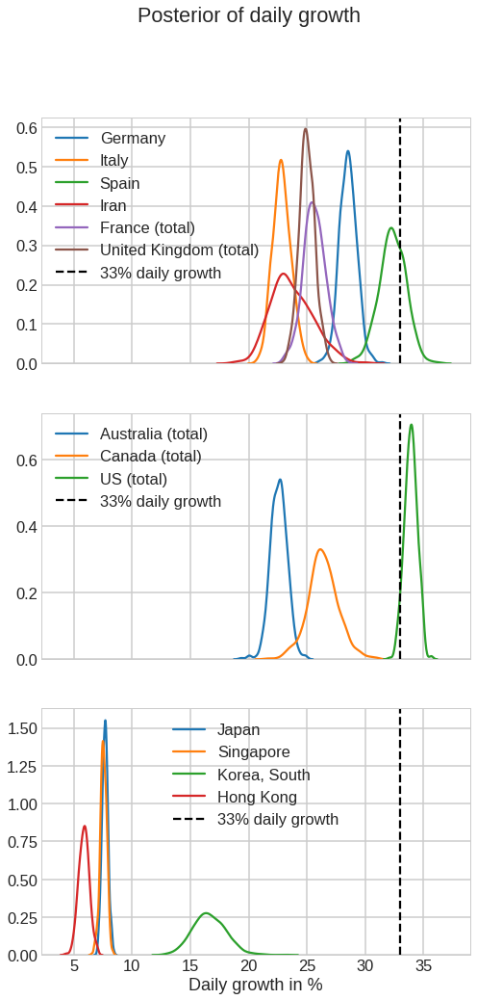

In [9]:
#hide_input

european_countries = ['Italy', 'Germany', 'France (total)', 'Spain', 'United Kingdom (total)', 
                      'Iran']
large_engl_countries = ['US (total)', 'Canada (total)', 'Australia (total)']
asian_countries = ['Singapore', 'Japan', 'Korea, South', 'Hong Kong']
south_american_countries = ['Argentina', 'Brazil', 'Colombia', 'Chile']

country_groups = [european_countries, large_engl_countries, asian_countries]
line_styles = ['-', ':', '--', '-.']


fig, axs = plt.subplots(nrows=len(country_groups), figsize=(8, 16), sharex=True)

for ax, country_group in zip(axs, country_groups):
    for i, country in enumerate(countries):
        if country in country_group:
            sns.distplot((trace['b_ind'][:, i] * 100) - 100, ax=ax, label=country, hist=False)
        
    ax.axvline(33, ls='--', color='k', label='33% daily growth')
    ax.legend()
ax.set_xlabel('Daily growth in %')
plt.suptitle('Posterior of daily growth')

## Model Diagnostics - Trace Plots

The following trace plots help to assess the convergence of the MCMC sampler.  You can safely ignore this if not familiar with [MCMC](https://en.wikipedia.org/wiki/Markov_chain_Monte_Carlo).

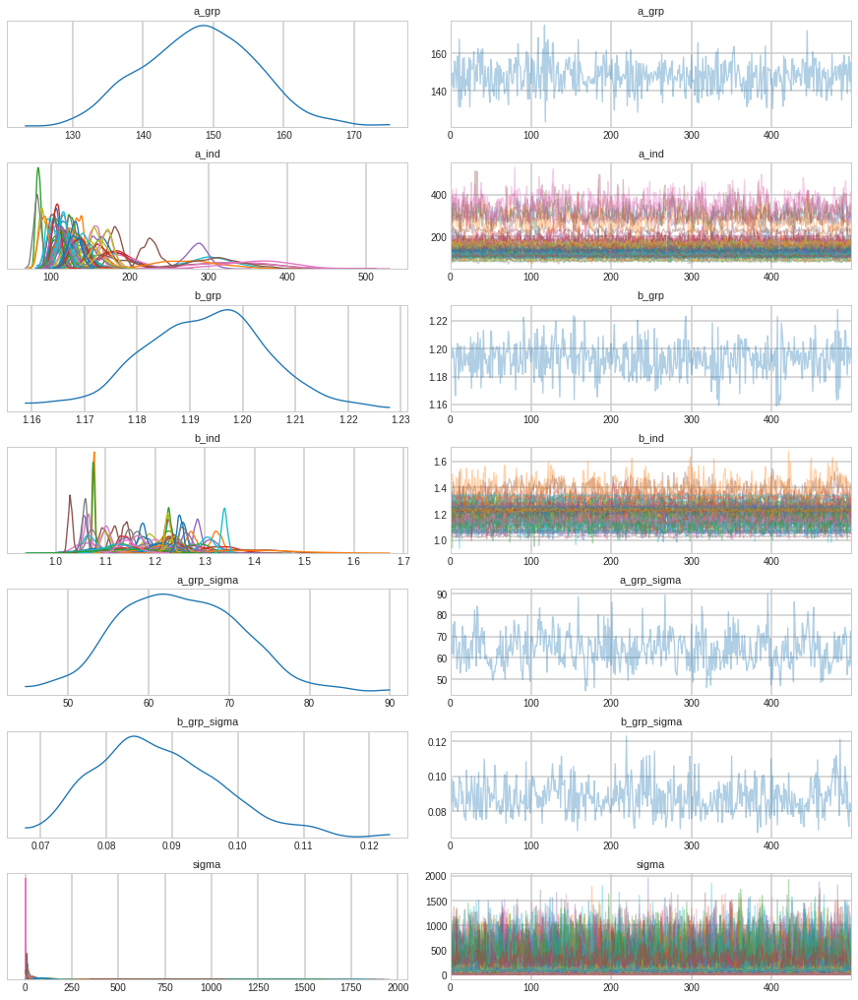

In [10]:
#hide_input
az.plot_trace(trace, compact=True);

## About This Analysis

This analysis was done by [Thomas Wiecki](https://twitter.com/twiecki). Interactive visualizations were created by [Hamel Husain](https://twitter.com/HamelHusain).

The model that we are building assumes exponential growth. This is definitely wrong because growth would just continue uninterrupted into the future. However, in the early phase of an epidemic it's a reasonable assumption.[^1]

We assume a [negative binomial](https://docs.pymc.io/api/distributions/discrete.html#pymc3.distributions.discrete.NegativeBinomial) likelihood as we are dealing with count data. A Poisson could also be used but the negative binomial allows us to also model the variance separately to give more flexibility.

The model is also hierarchical, pooling information from individual countries.


[^1]:  This notebook gets up-to-date data from the ["2019 Novel Coronavirus COVID-19 (2019-nCoV) Data Repository by Johns Hopkins CSSE"](https://systems.jhu.edu/research/public-health/ncov/) [GitHub repository](https://github.com/CSSEGISandData/COVID-19). This code is provided under the [BSD-3 License](https://github.com/twiecki/covid19/blob/master/LICENSE). Link to [original notebook](https://github.com/twiecki/covid19/blob/master/covid19_growth_bayes.ipynb).